In [1]:
import numpy as np
import pandas as pd 
import cmath 
import glob
import scipy.special as sp
import scipy.signal as spg
import scipy.constants as const
import matplotlib.pyplot as plt
plt.style.use('dark_background')
plt.rcParams['axes.labelsize'] = 18
plt.rcParams['axes.titlesize'] = 24
plt.rcParams['legend.fontsize'] = 8
import VNA_data_read_local as vdr
import useful_functions as uf

In [2]:
# regular data 
baselines = glob.glob('/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/baselines/*.txt')
rot1 = glob.glob('/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/rot1/*.txt')
rot1FL = glob.glob('/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/rot1FL/*.txt')
rot3 = glob.glob('/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/rot3/*.txt')
rot5 = glob.glob('/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/rot5/*.txt')

# vertical disk data
vert_baselines = glob.glob('/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/vert_baselines/*.txt')
vert = glob.glob('/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/vert/*.txt')


In [3]:
baselines

['/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/baselines/LSB_baseline0609_3_2.5to6.18GHz_2025-06-09_13-46-54.txt',
 '/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/baselines/LSB_baseline0609_2_2.5to6.18GHz_2025-06-09_13-45-54.txt',
 '/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/baselines/LSB_BL2_1_2.5to6.18GHz_2025-06-09_14-17-30.txt',
 '/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/baselines/LSB_BL2_2_2.5to6.18GHz_2025-06-09_14-18-26.txt',
 '/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/baselines/LSB_baseline0609_1_2.5to6.18GHz_2025-06-09_13-44-56.txt']

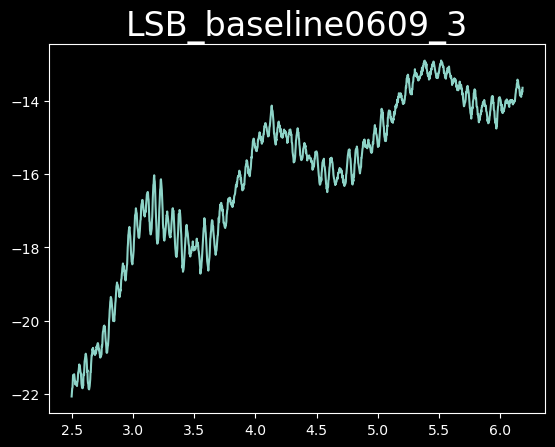

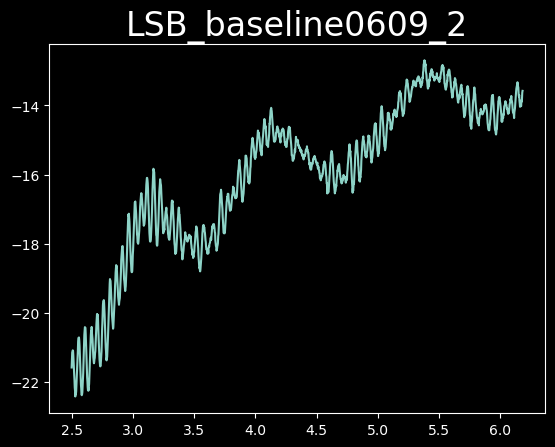

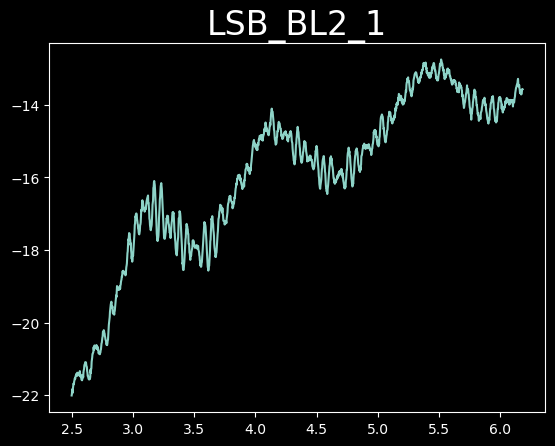

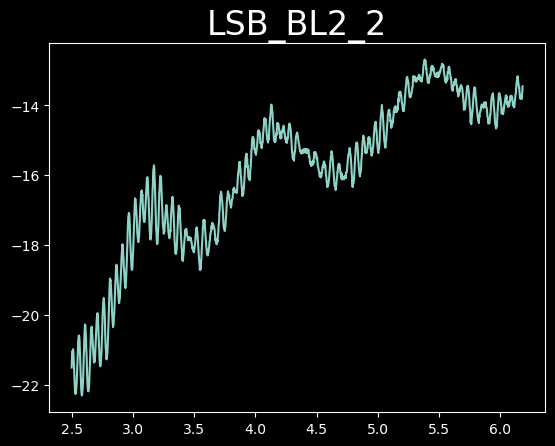

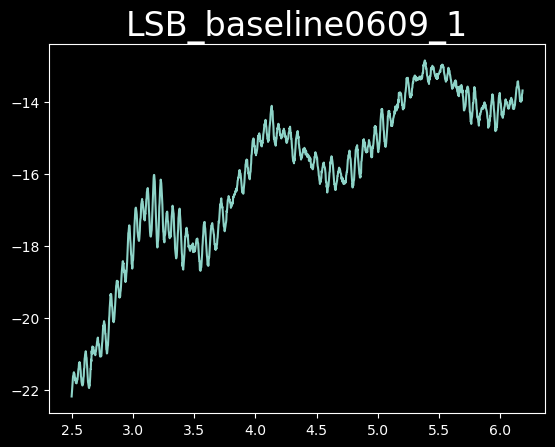

In [4]:
# look at baselines 
for i in range(len(baselines)): 
    test_run = baselines[i].split('/')[-1]
    run_name_split = test_run.split('_')
    run_name_for_plot = run_name_split[0] + '_' + run_name_split[1] + '_' + run_name_split[2]
    baseline = uf.just_single_loader(baselines[i])
    plt.figure()
    plt.plot(baseline['Freq (Hz)']/1e9, 20*np.log10(np.abs(baseline['Complex (decimal)'])))
    plt.title(run_name_for_plot)

Baselines looking all different. 
Quieter baselines: 
- 'LSB_baseline0609_3'
- 'LSB_baseline0609_1'
- 'LSB_BL2_1' **QUIETEST**

Noisier: 
- 'LSB_baseline0609_2'
- 'LSB_BL2_2'

## Rotation 1

In [5]:
rot1

['/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/rot1/LSB_rot1_1mm_2.5to6.18GHz_2025-06-09_14-04-12.txt',
 '/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/rot1/LSB_rot1_Submm2_2.5to6.18GHz_2025-06-09_14-02-57.txt',
 '/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/rot1/LSB_rot1_Submm_2.5to6.18GHz_2025-06-09_14-01-57.txt',
 '/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/rot1/LSB_rot1_2.5mm2_2.5to6.18GHz_2025-06-09_14-06-30.txt',
 '/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/rot1/LSB_rot1_2.5mm_2.5to6.18GHz_2025-06-09_14-05-33.txt']

In [6]:
test_run = rot1[i].split('/')[-1]

In [7]:
test_run

'LSB_rot1_2.5mm_2.5to6.18GHz_2025-06-09_14-05-33.txt'

In [8]:
data_folder_path = 'calibrated/data/data_060925'

baseline_2_2 = 'baselines/LSB_BL2_2_2.5to6.18GHz_2025-06-09_14-18-26.txt'
baseline_2_1 = 'baselines/LSB_BL2_1_2.5to6.18GHz_2025-06-09_14-17-30.txt'
baseline_0609_1 = 'baselines/LSB_baseline0609_1_2.5to6.18GHz_2025-06-09_13-44-56.txt'
baseline_0609_2 = 'baselines/LSB_baseline0609_2_2.5to6.18GHz_2025-06-09_13-45-54.txt'
baseline_0609_3 = 'baselines/LSB_baseline0609_3_2.5to6.18GHz_2025-06-09_13-46-54.txt'

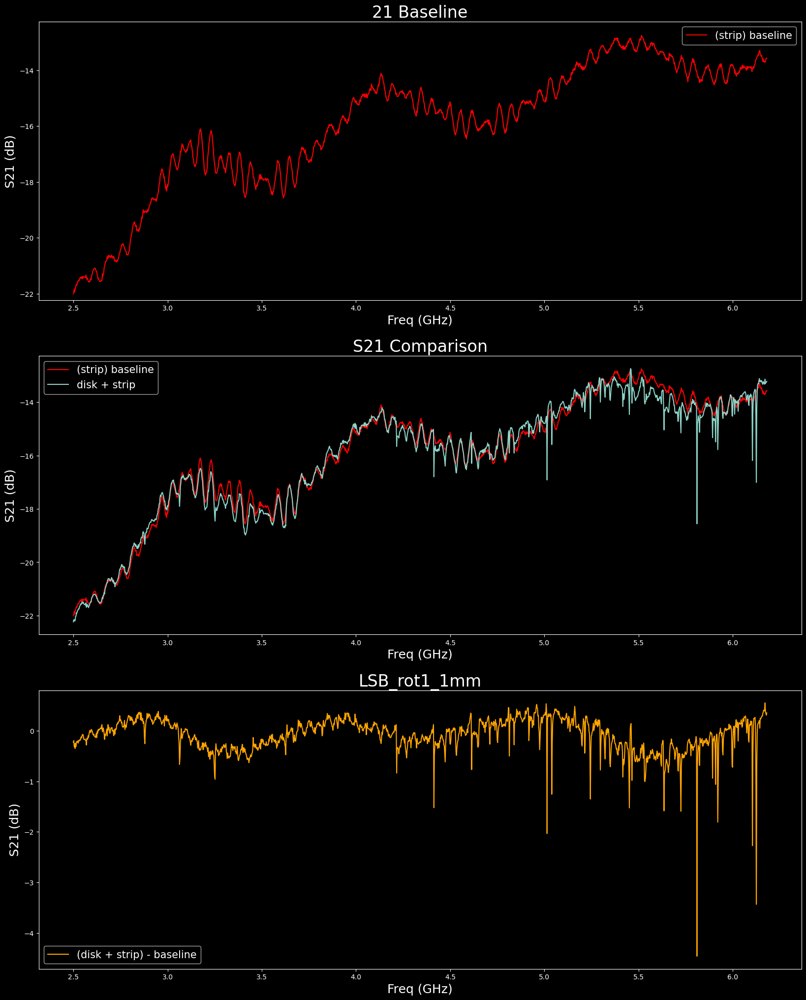

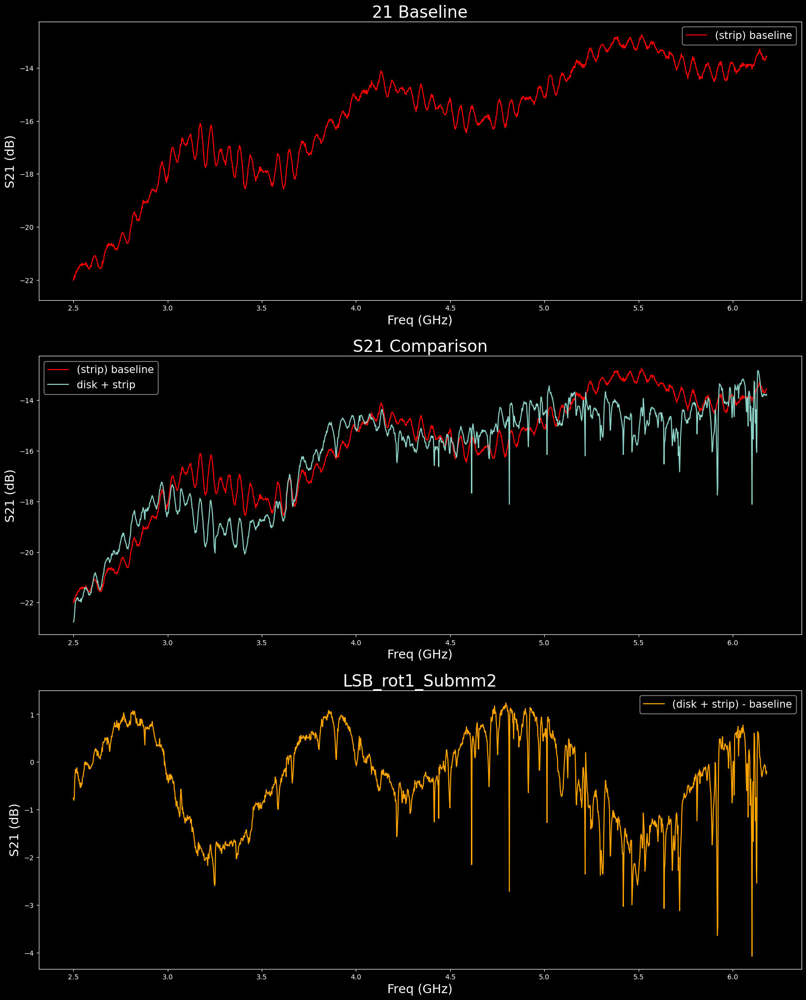

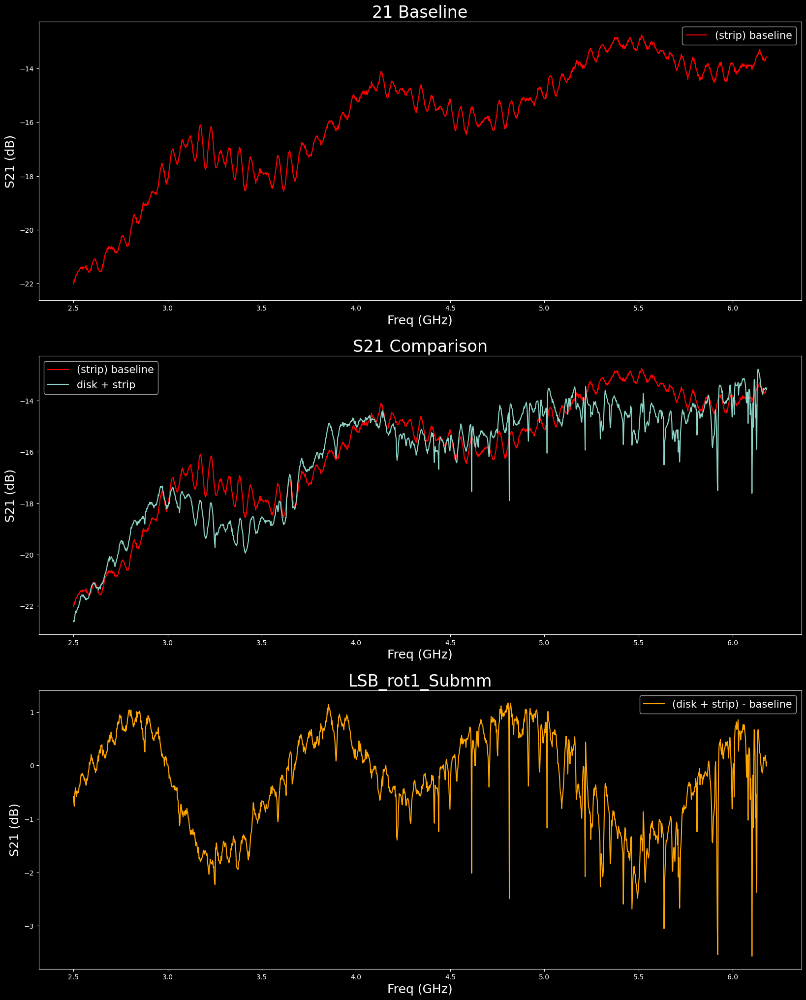

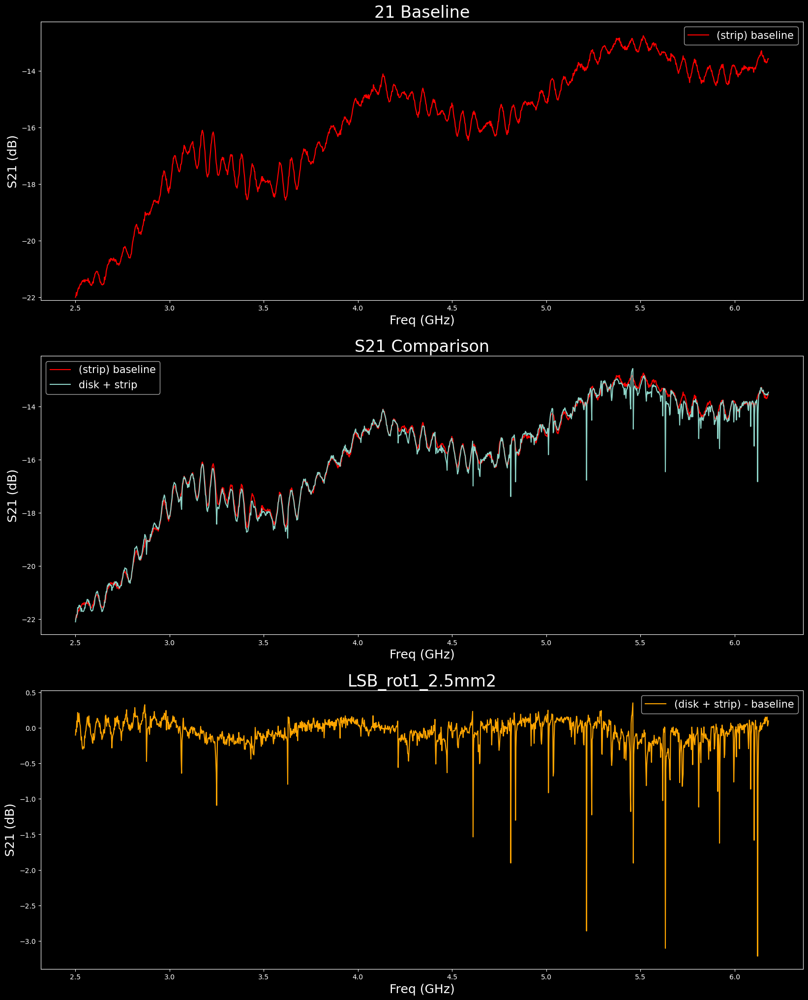

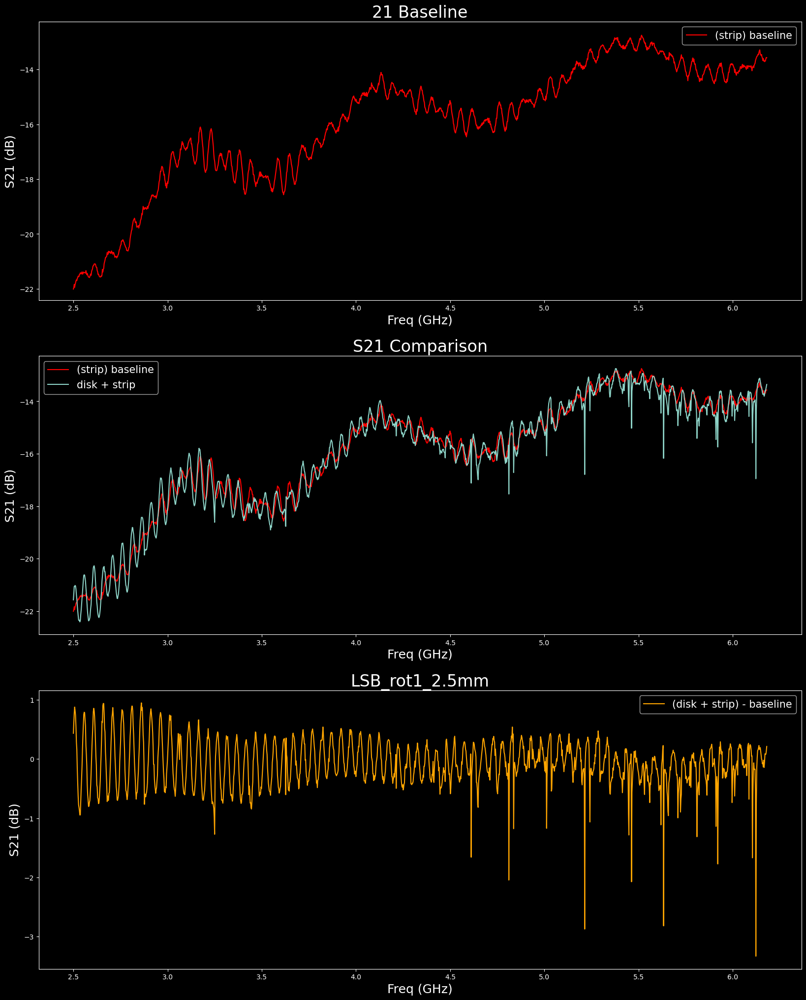

In [9]:
# look at baselines 
for i in range(len(rot1)): 
    
    # for ID-ing run parameters and printing in plots
    test_run = rot1[i].split('/')[-1]
    run_name_split = test_run.split('_')
    run_name_for_plot = run_name_split[0] + '_' + run_name_split[1] + '_' + run_name_split[2]
    
    # plotting 
    plot = uf.loader_plotter(baseline_filename = baseline_2_1, 
                             disk_res_filename = 'rot1/' + test_run, 
                             folder = data_folder_path)
    # plt.figure()
    # plt.plot(baseline['Freq (Hz)']/1e9, 20*np.log10(np.abs(baseline['Complex (decimal)'])))
    plt.title(run_name_for_plot)

with slightly noisier baseline: 

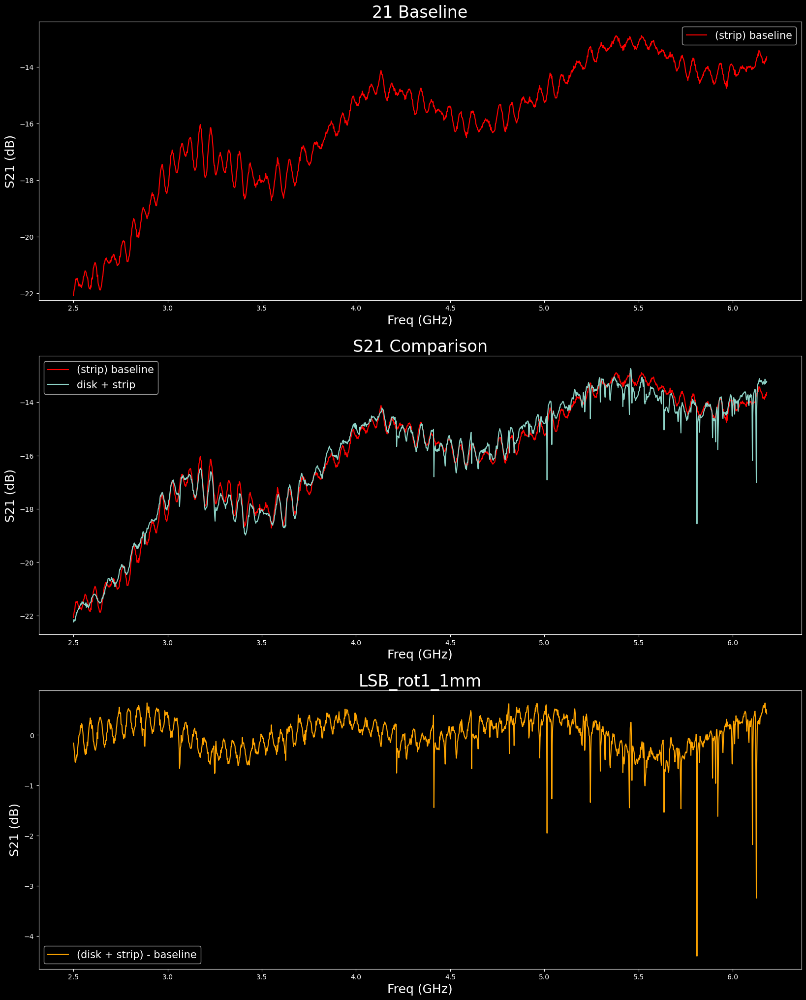

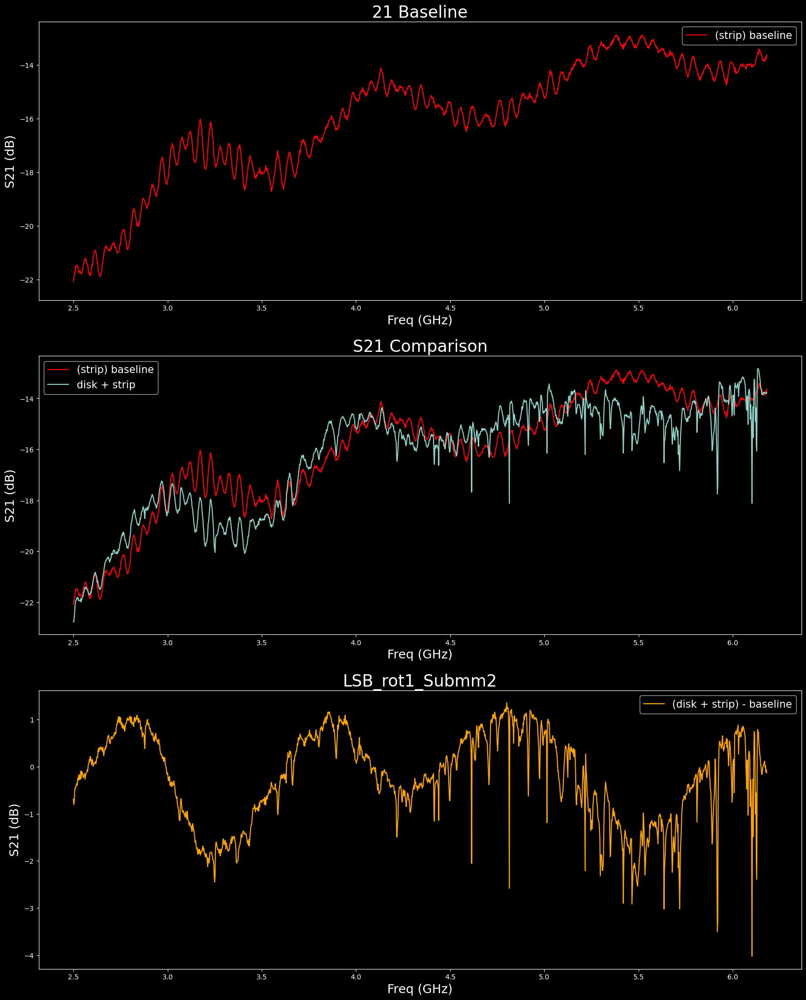

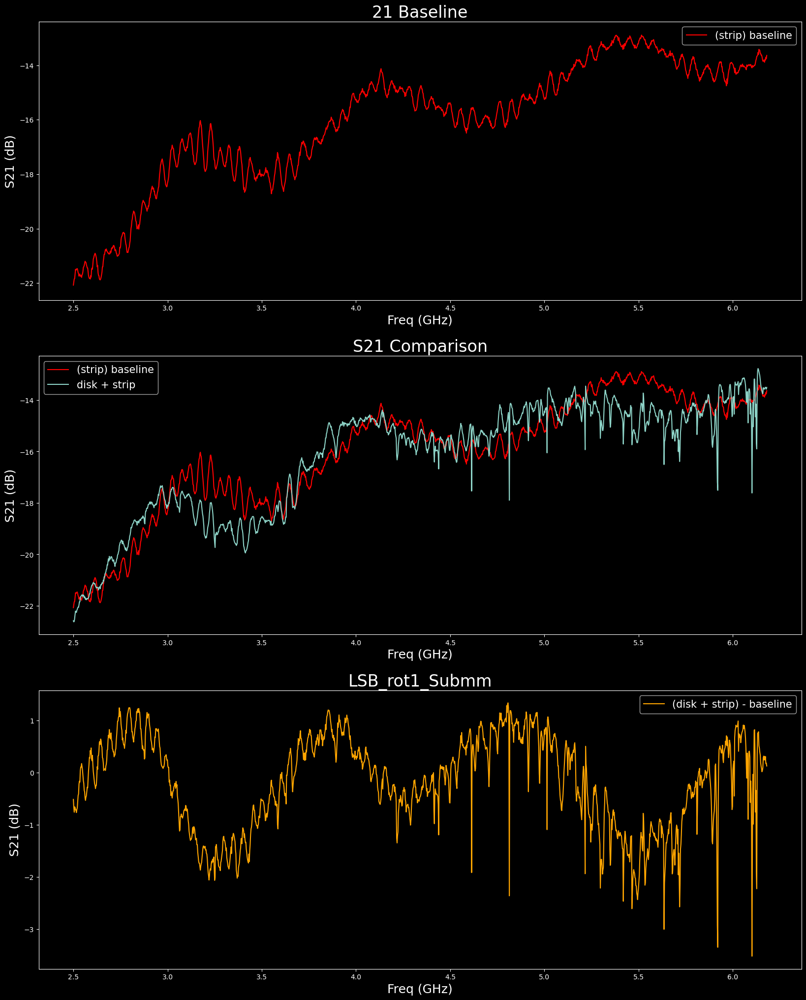

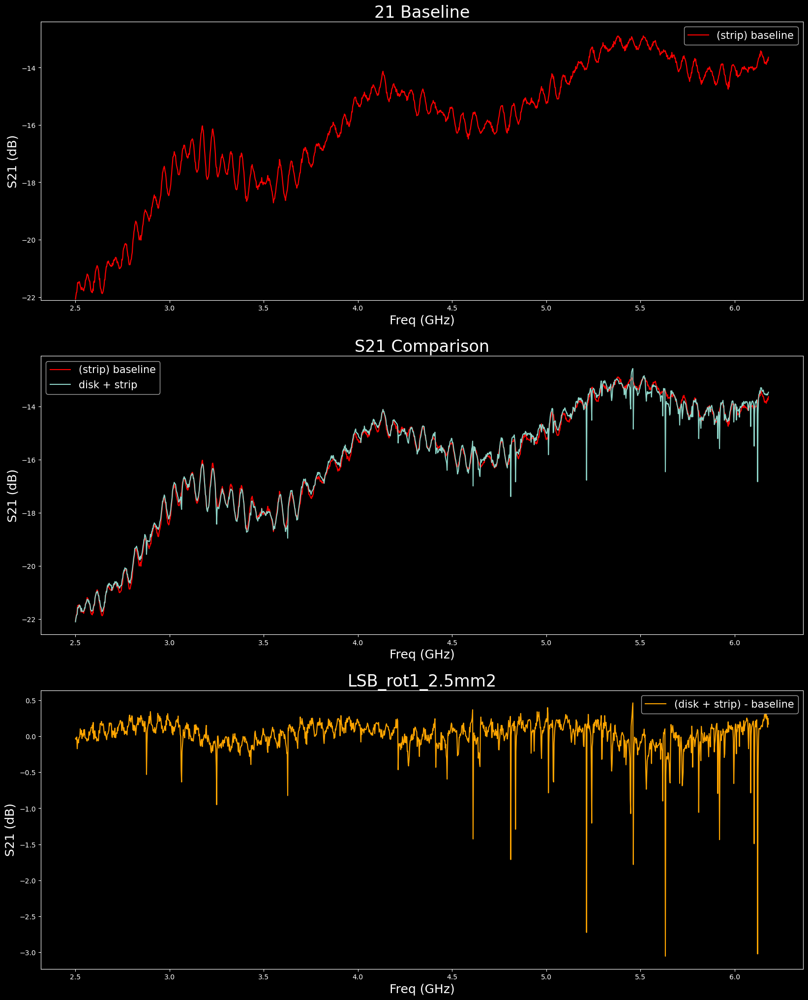

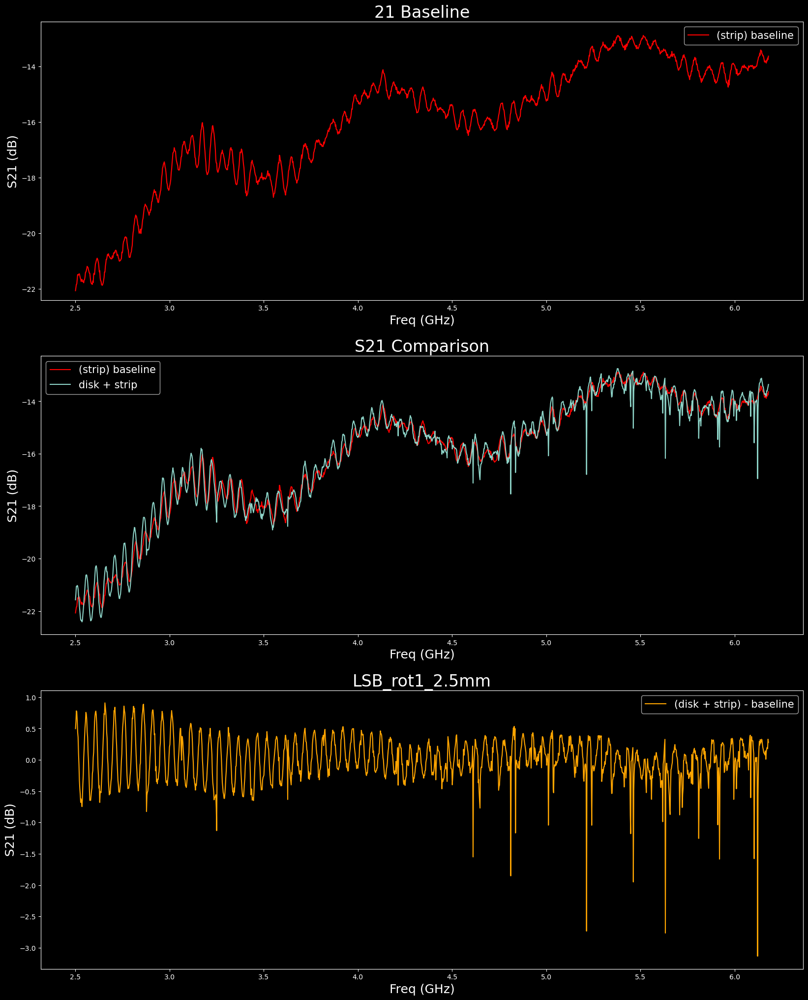

In [10]:
# look at baselines 
for i in range(len(rot1)): 
    
    # for ID-ing run parameters and printing in plots
    test_run = rot1[i].split('/')[-1]
    run_name_split = test_run.split('_')
    run_name_for_plot = run_name_split[0] + '_' + run_name_split[1] + '_' + run_name_split[2]
    
    # plotting 
    plot = uf.loader_plotter(baseline_filename = baseline_0609_3, 
                             disk_res_filename = 'rot1/' + test_run, 
                             folder = data_folder_path)
    # plt.figure()
    # plt.plot(baseline['Freq (Hz)']/1e9, 20*np.log10(np.abs(baseline['Complex (decimal)'])))
    plt.title(run_name_for_plot)

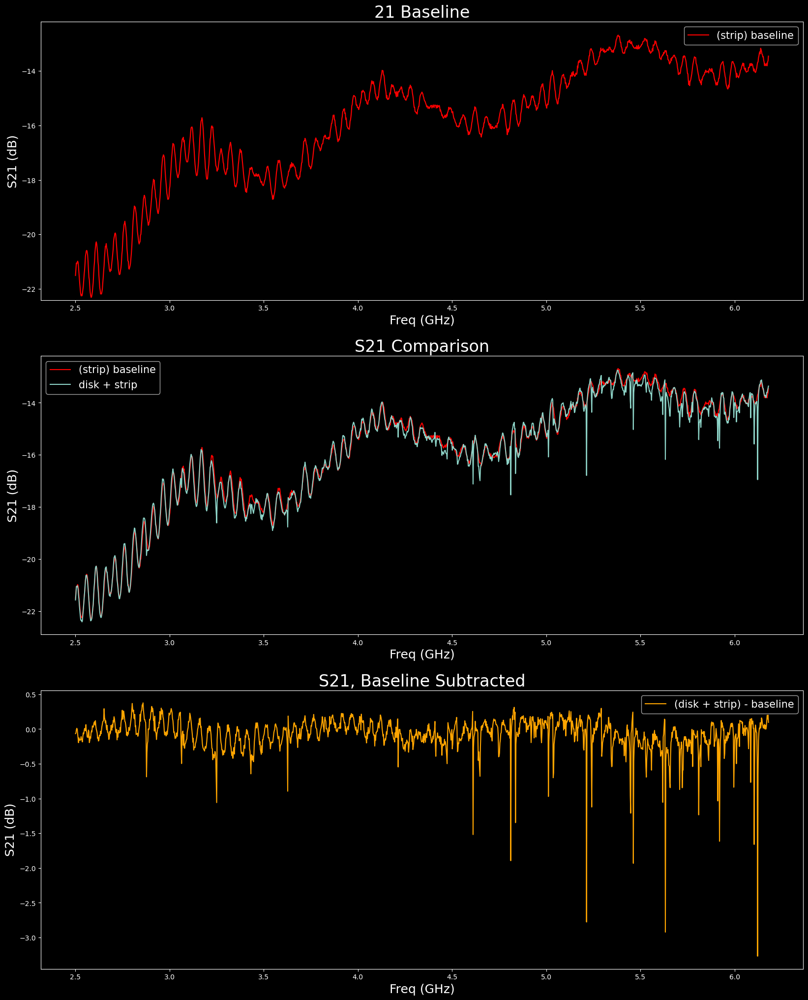

In [11]:
# testing: can I de-noise the LSB_rot1_2.5mm with the noisier baseline? 

de_noise_BL = uf.loader_plotter(baseline_filename = baseline_2_2, 
                                disk_res_filename = 'rot1/LSB_rot1_2.5mm_2.5to6.18GHz_2025-06-09_14-05-33.txt', 
                                folder = data_folder_path)

In [12]:
main_directory_path = '/Users/leayamashiro/whispering_gallery_MAIN/'

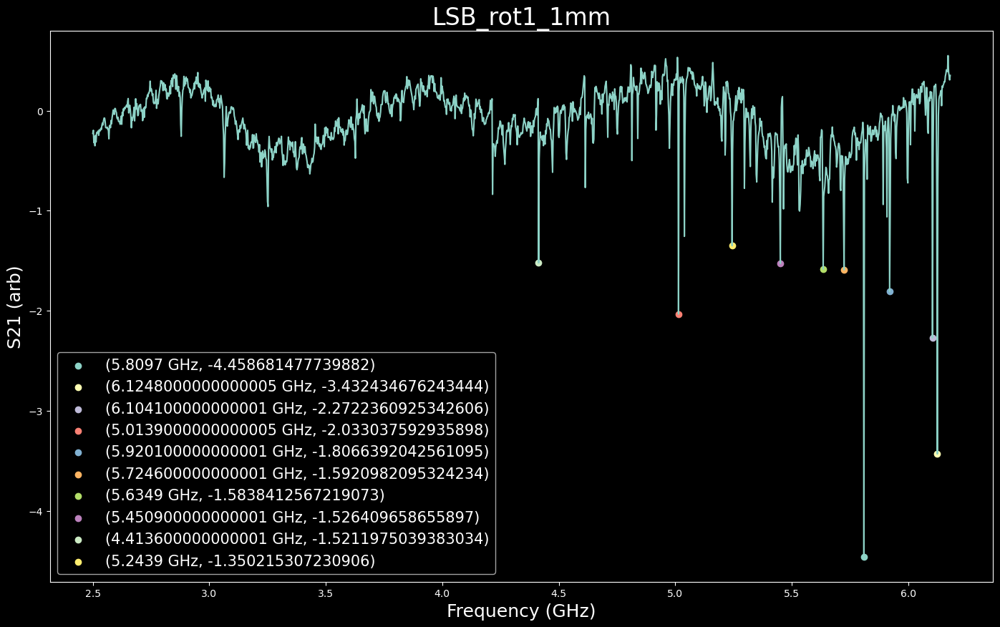

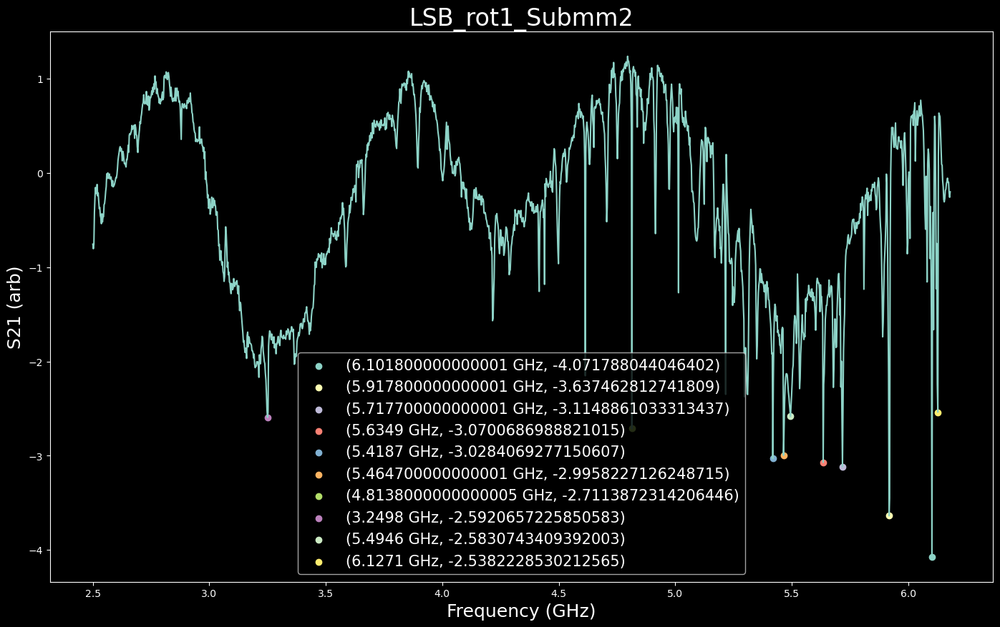

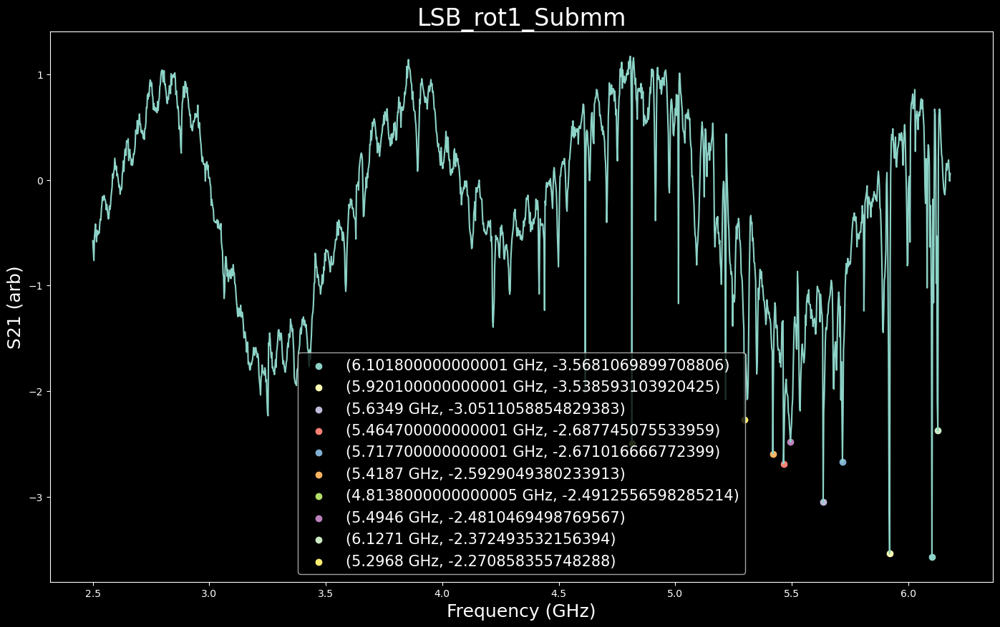

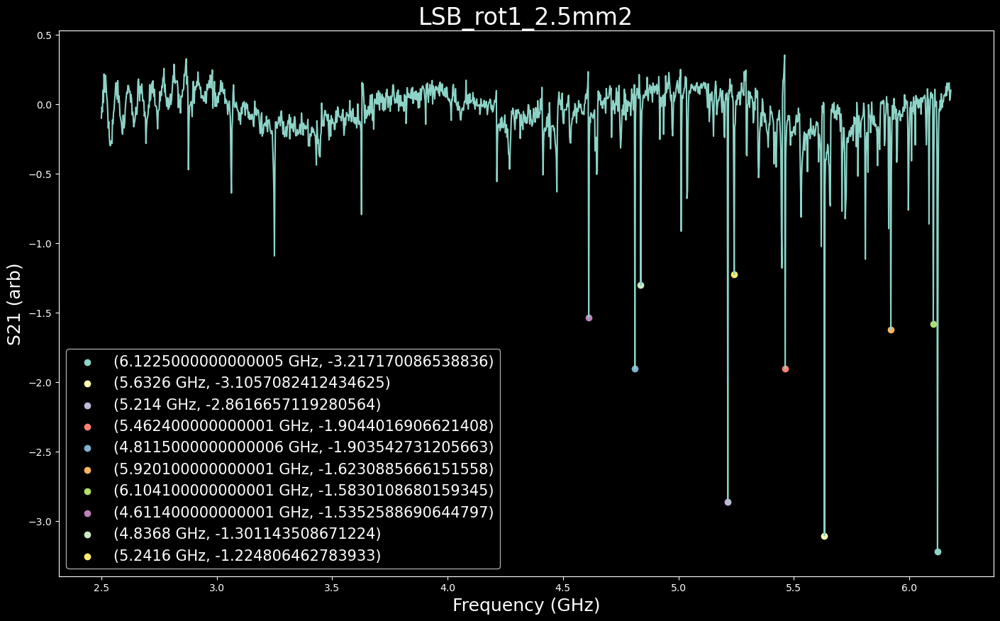

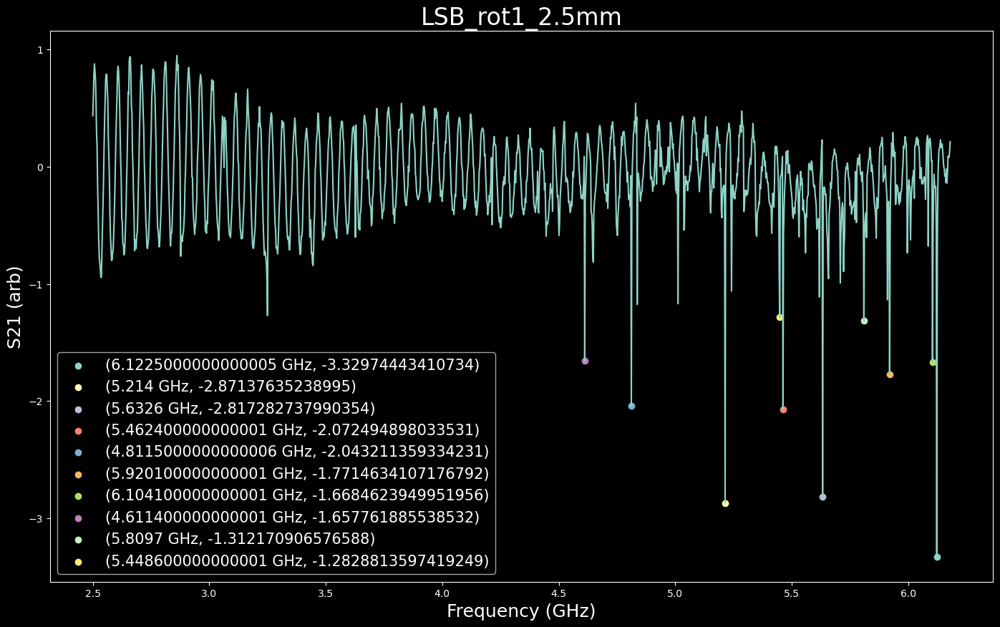

In [13]:
# look at baselines 
for i in range(len(rot1)): 
    
    # for ID-ing run parameters and printing in plots
    test_run = rot1[i].split('/')[-1]
    run_name_split = test_run.split('_')
    run_name_for_plot = run_name_split[0] + '_' + run_name_split[1] + '_' + run_name_split[2]
    
    # loading in as data 
    baseline = uf.just_single_loader(main_directory_path + data_folder_path + '/' + baseline_2_1)
    disk = uf.just_single_loader(main_directory_path + data_folder_path + '/rot1/' + test_run)
    # plotting 
    plot = uf.find_plot_dips(BL = baseline, 
                             disk = disk,
                             n_dips = 10, 
                             title = run_name_for_plot)
    # plt.figure()
    # plt.plot(baseline['Freq (Hz)']/1e9, 20*np.log10(np.abs(baseline['Complex (decimal)'])))
    #plt.title(run_name_for_plot)

In [14]:
glob_loaded = rot1
stri = str(glob_loaded)
stri

"['/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/rot1/LSB_rot1_1mm_2.5to6.18GHz_2025-06-09_14-04-12.txt', '/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/rot1/LSB_rot1_Submm2_2.5to6.18GHz_2025-06-09_14-02-57.txt', '/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/rot1/LSB_rot1_Submm_2.5to6.18GHz_2025-06-09_14-01-57.txt', '/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/rot1/LSB_rot1_2.5mm2_2.5to6.18GHz_2025-06-09_14-06-30.txt', '/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/rot1/LSB_rot1_2.5mm_2.5to6.18GHz_2025-06-09_14-05-33.txt']"

In [15]:
run_name_split = rot1[0].split('_')
run_name_split[4]

'rot1'

In [16]:
test_run = rot1[0].split('/')[-1]
run_name_split = test_run.split('_')
run_name_split

['LSB', 'rot1', '1mm', '2.5to6.18GHz', '2025-06-09', '14-04-12.txt']

In [17]:
# function to streamline this
def folder_plotter_dipID(baseline_file, glob_loaded, data_folder_path, f_start=None, f_stop=None):
    main_directory_path = '/Users/leayamashiro/whispering_gallery_MAIN/'
    for i in range(len(glob_loaded)): 
        # for ID-ing run parameters and printing in plots
        test_run = glob_loaded[i].split('/')[-1]
        run_name_split = test_run.split('_')
        run_name_for_plot = run_name_split[0] + '_' + run_name_split[1] + '_' + run_name_split[2]
        # loading in as data 
        baseline = uf.just_single_loader(main_directory_path + data_folder_path + '/' + baseline_file)
        disk = uf.just_single_loader(main_directory_path + data_folder_path + '/' + run_name_split[1] + '/' + test_run)
        # plotting 
        plot = uf.find_plot_dips(BL = baseline, 
                                disk = disk,
                                n_dips = 10, # f_start, f_stop
                                title = run_name_for_plot)

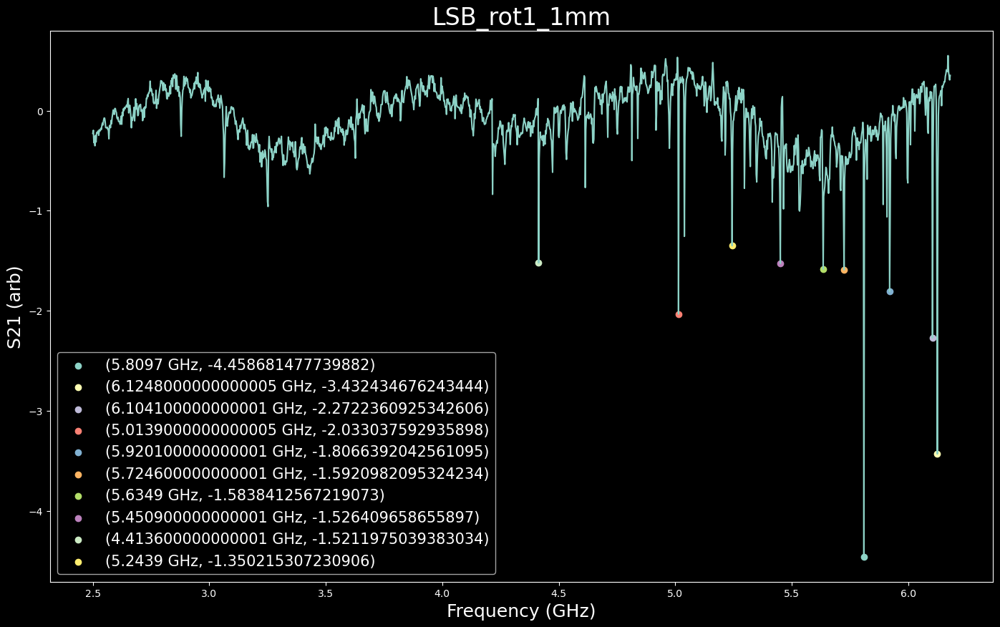

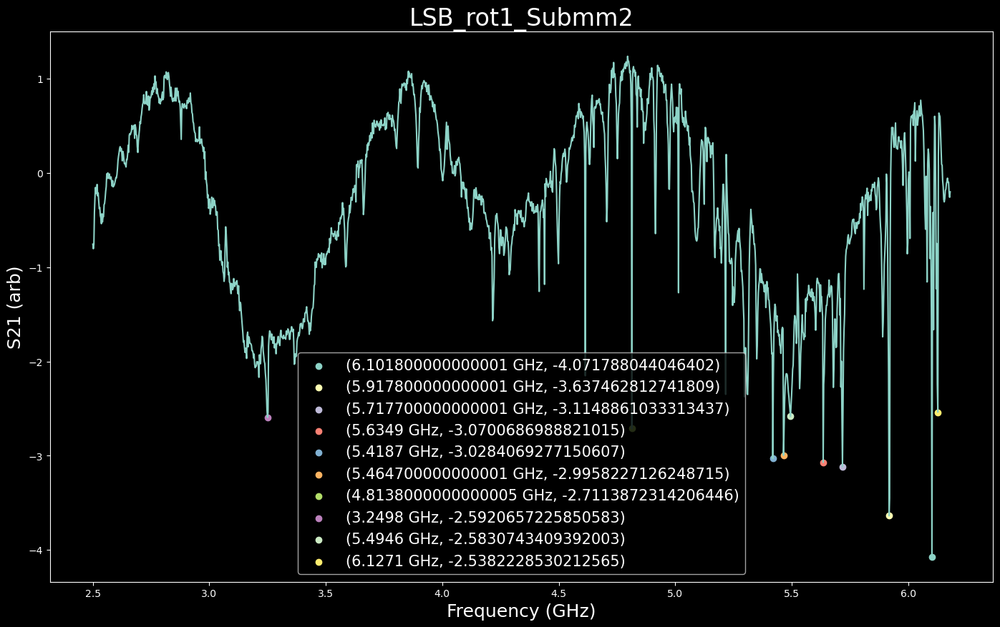

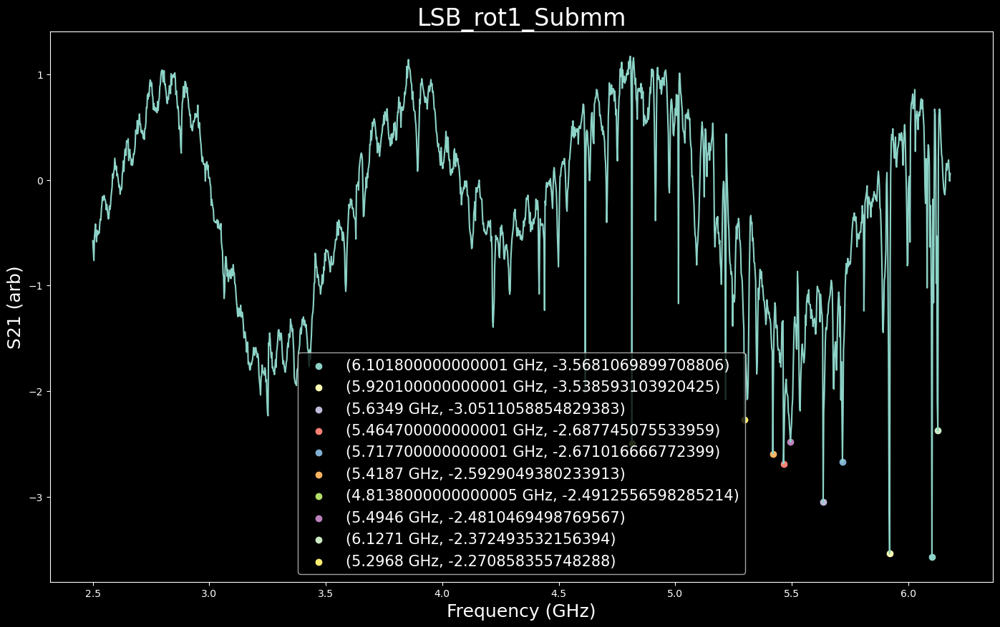

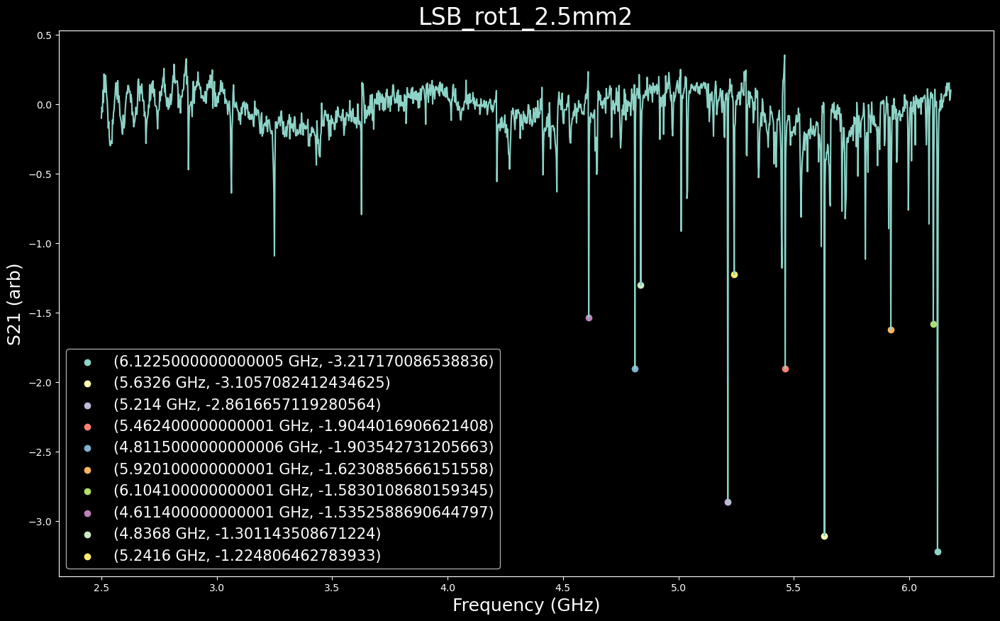

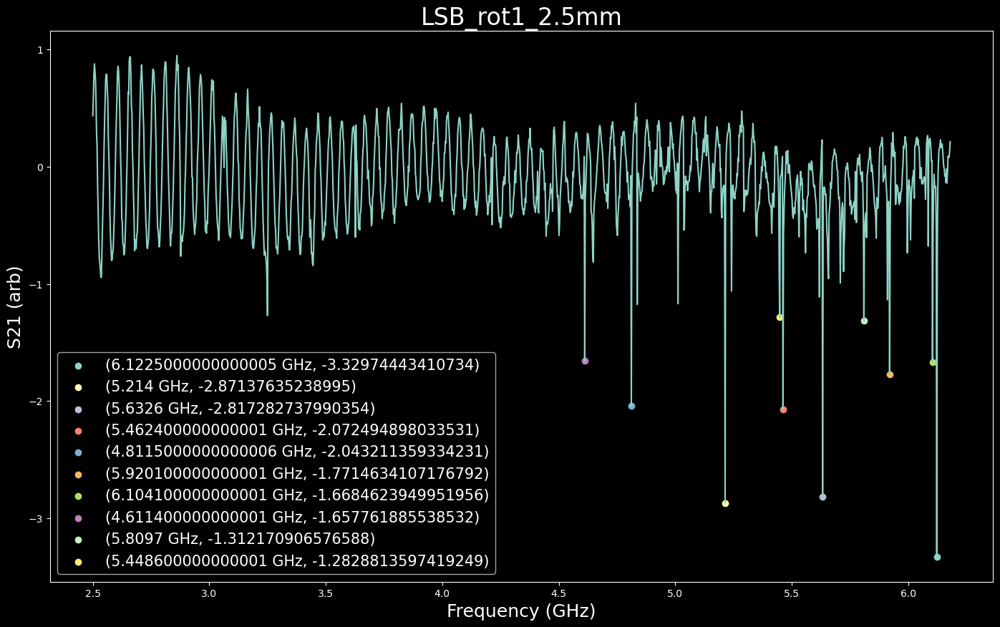

In [18]:
test_func = folder_plotter_dipID(baseline_2_1, rot1, data_folder_path)

In [19]:
main_directory_path

'/Users/leayamashiro/whispering_gallery_MAIN/'

## ROT 1 Flipped

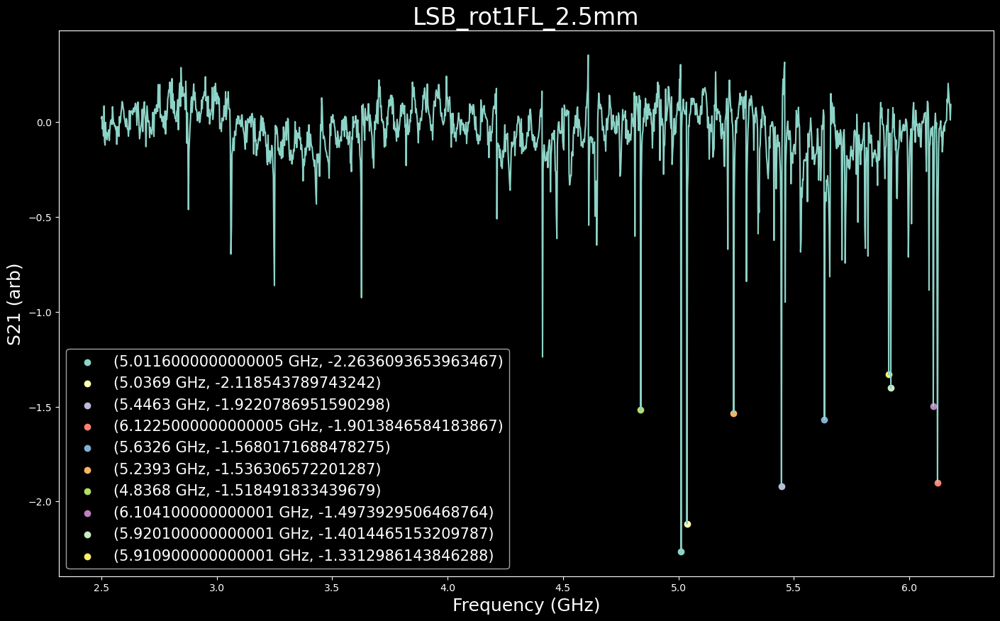

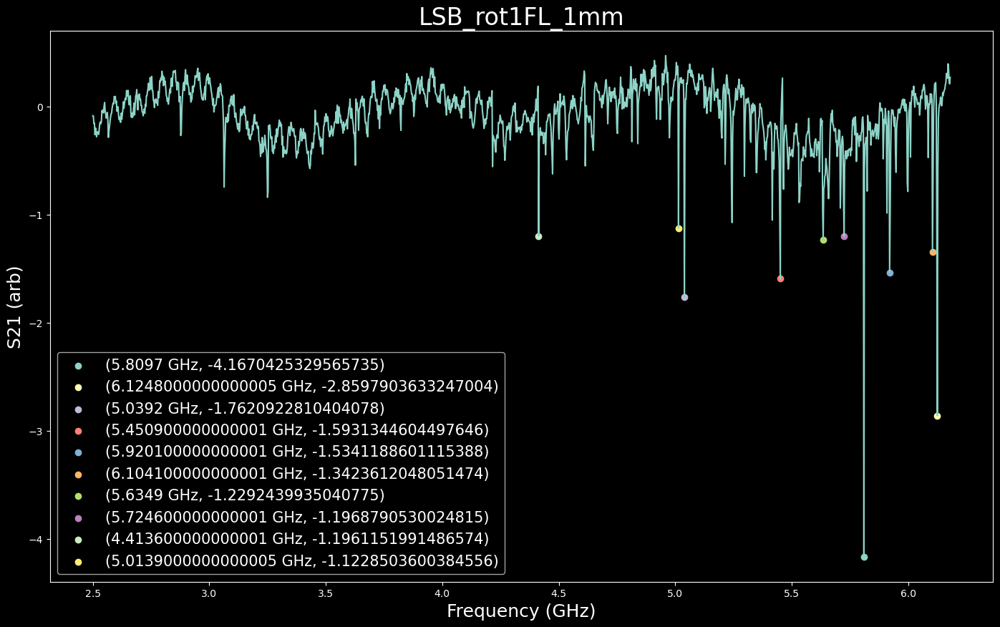

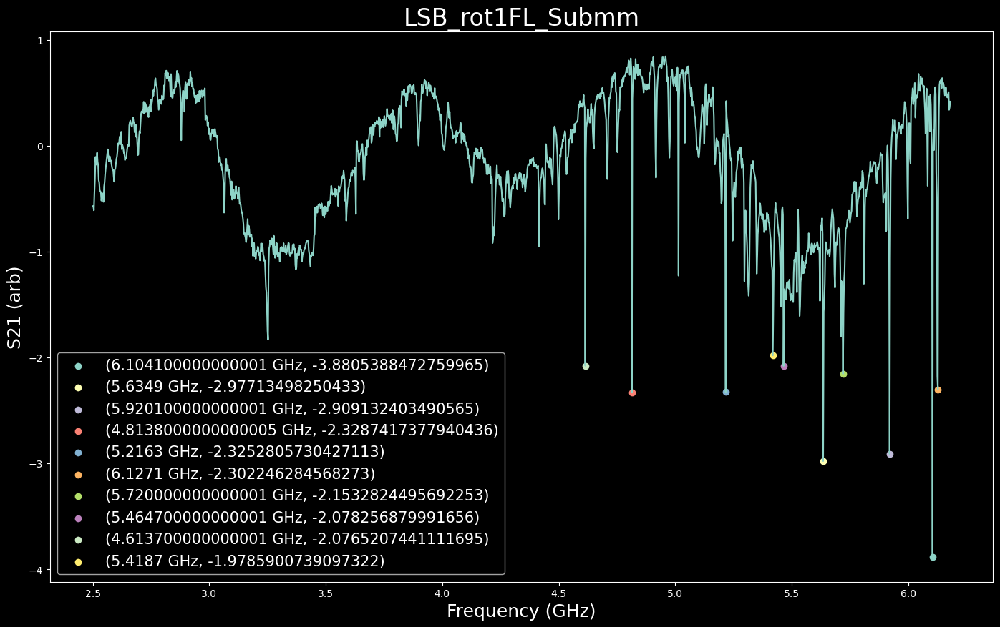

In [20]:
rot1_flipped_dips = folder_plotter_dipID(baseline_2_1, rot1FL, data_folder_path, f_start = 2.5, f_stop = 4.5)

## Rotation 3

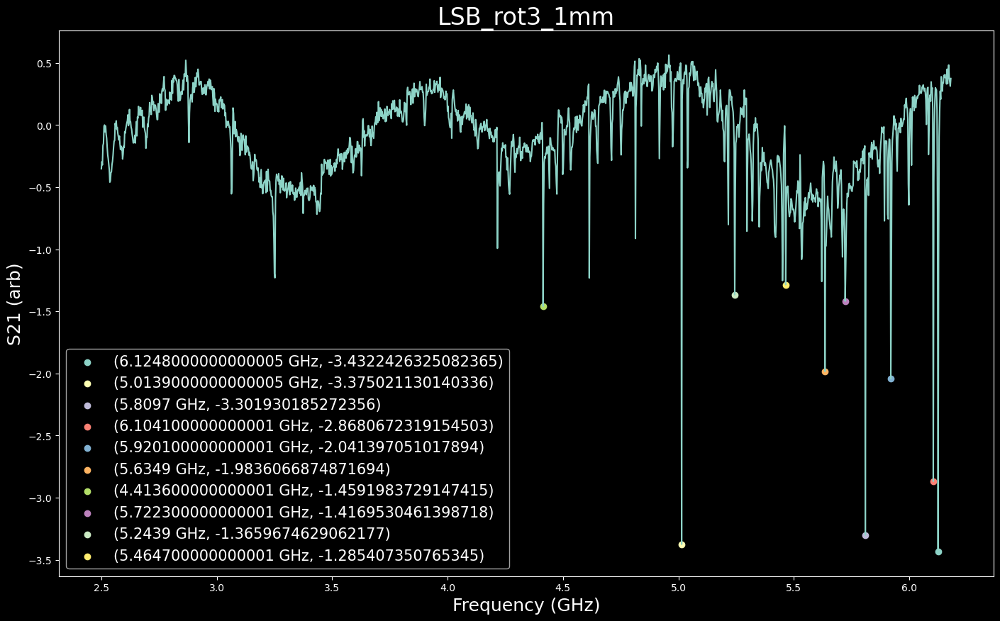

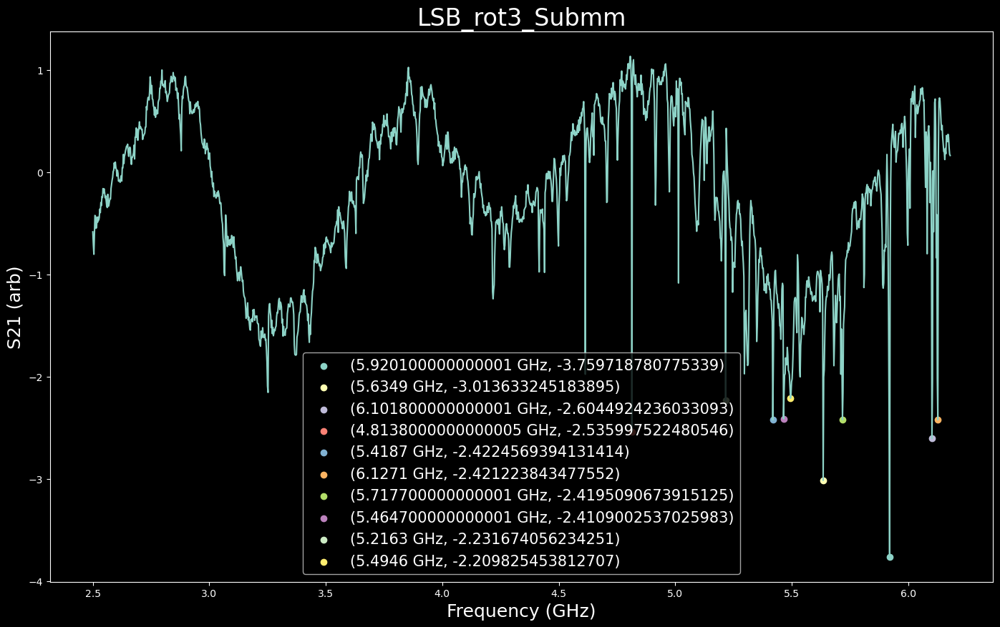

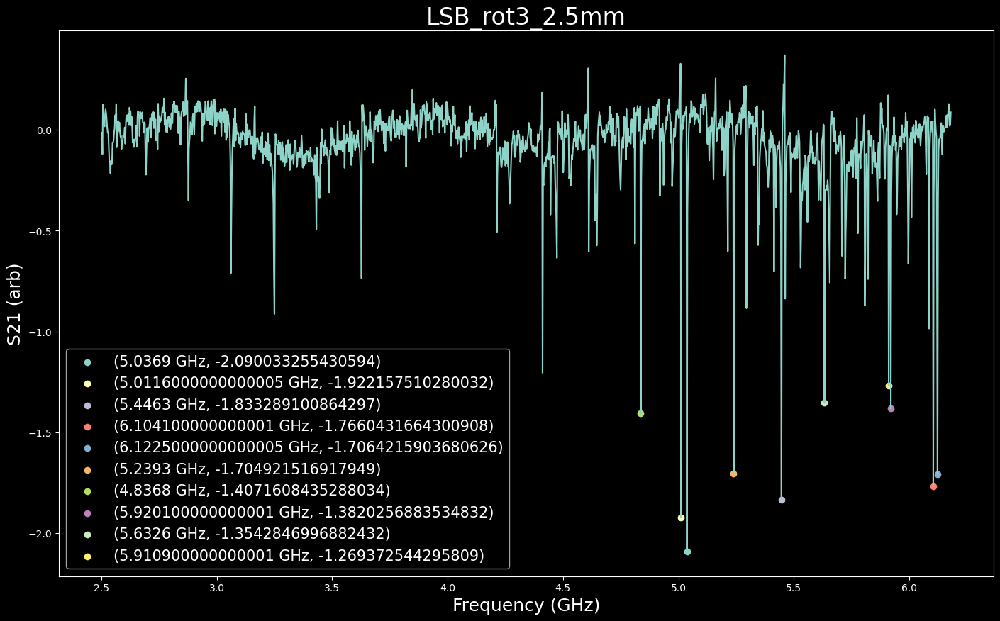

In [21]:
rot1_flipped_dips = folder_plotter_dipID(baseline_2_1, rot3, data_folder_path, f_start = 2.5, f_stop = 4.5)

## Rotation 5

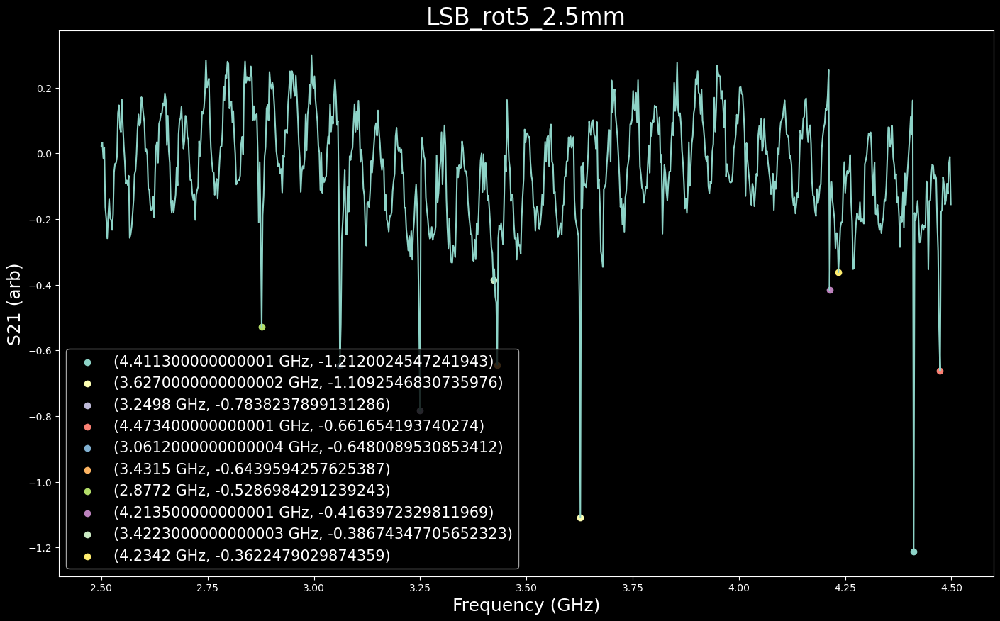

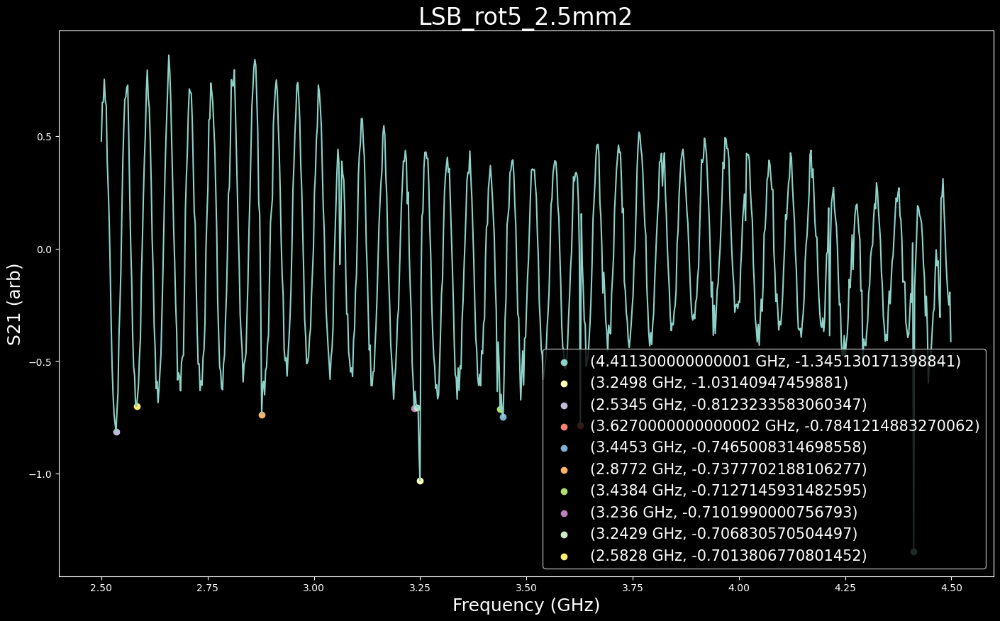

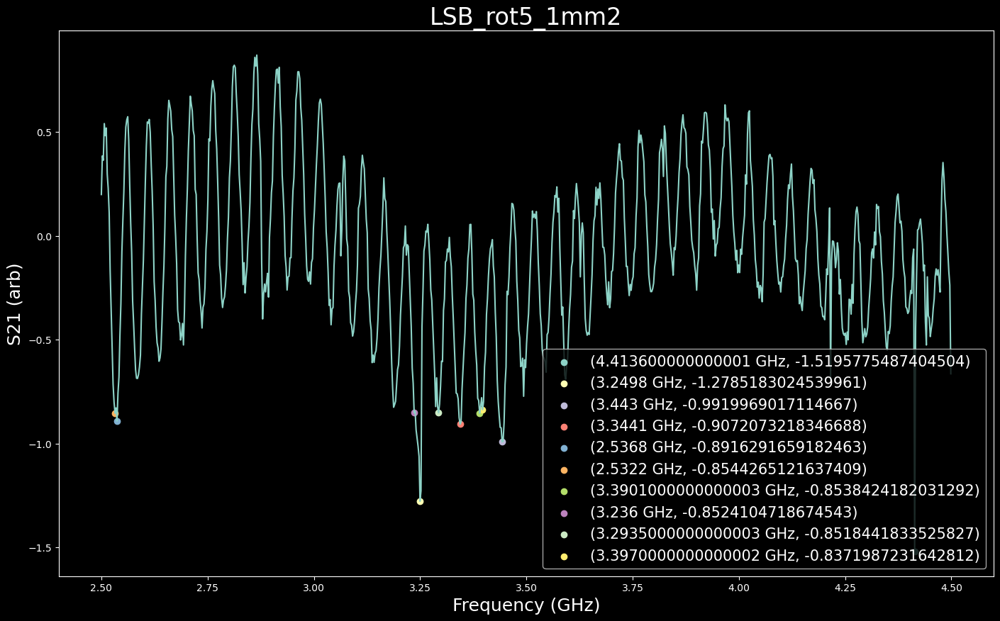

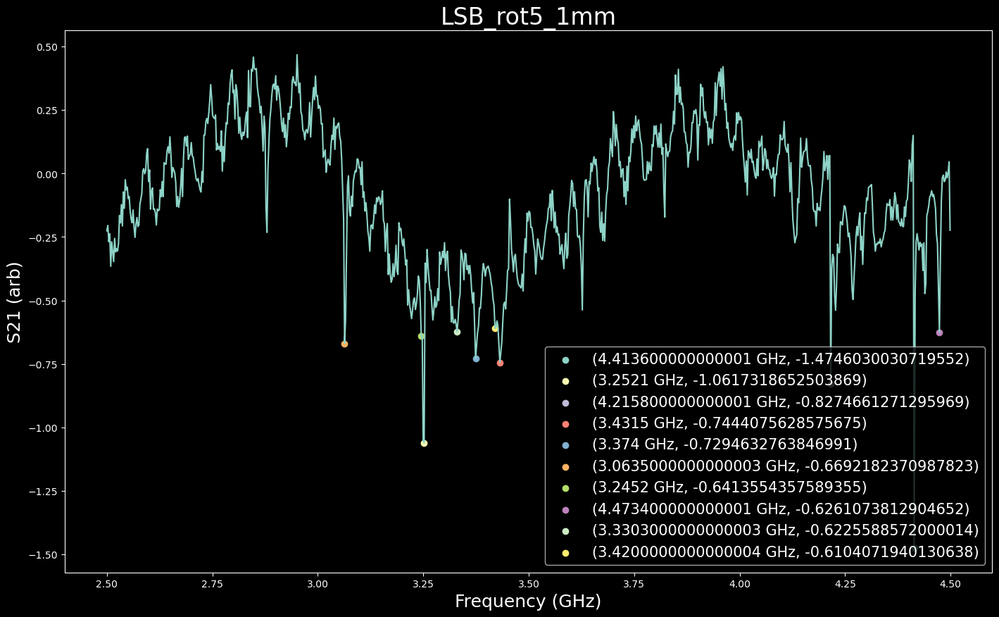

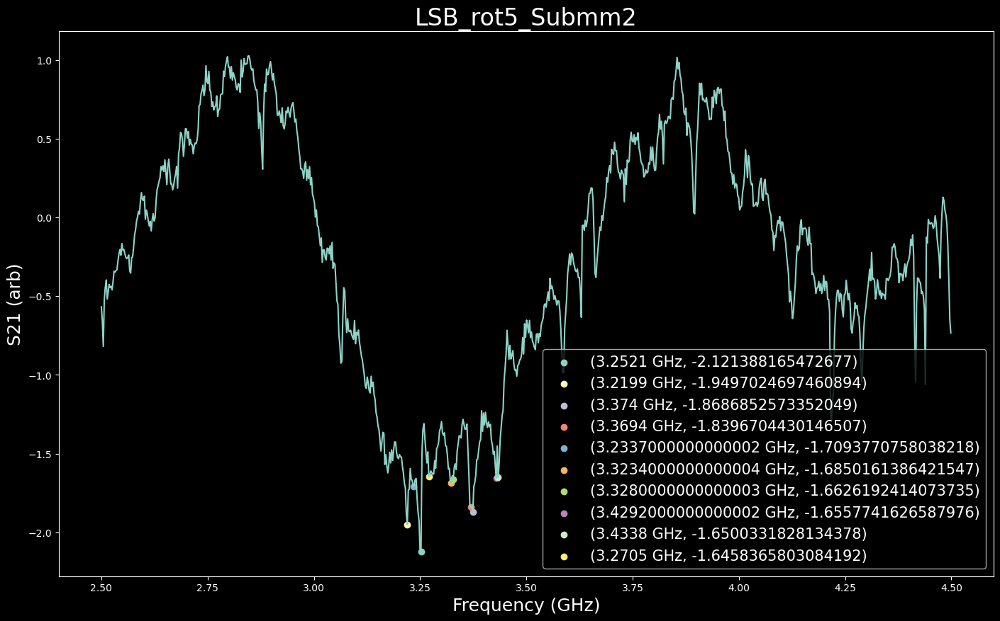

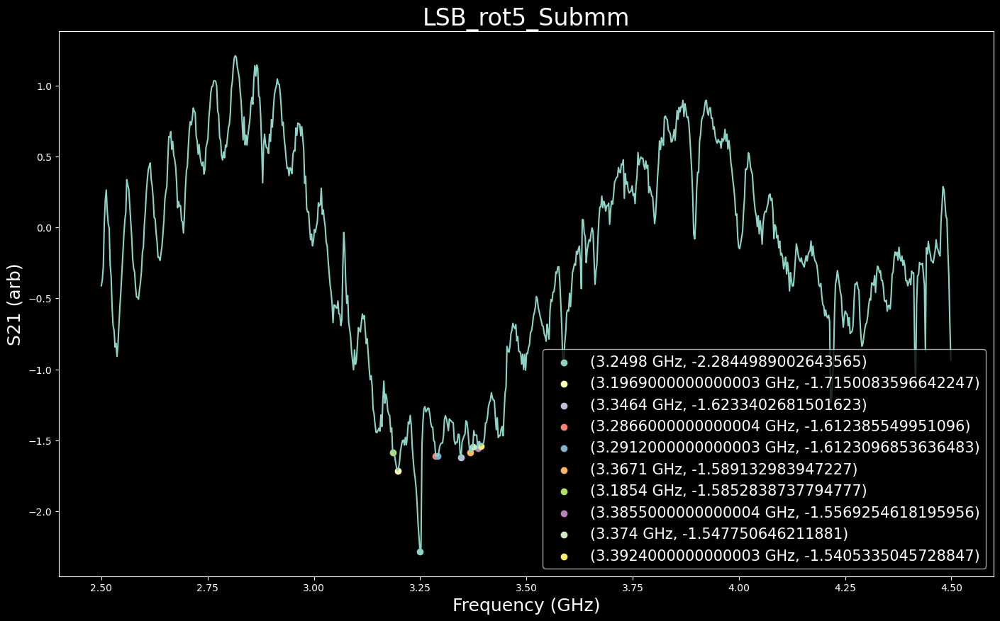

In [22]:
rot1_flipped_dips = uf.folder_plotter_dipID(baseline_2_1, rot5, data_folder_path, f_start = 2.5, f_stop = 4.5)

# LOOKING AT VERTICAL!!!!

1. check out baselines
2. calibrate 

In [23]:
vert_baselines

['/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/vert_baselines/LSB_VERT_BASELINE2_3_2.5to6.18GHz_2025-06-09_14-37-45.txt',
 '/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/vert_baselines/LSB_weirdBL_2.5to6.18GHz_2025-06-09_14-16-19.txt',
 '/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/vert_baselines/LSB_VERT_BASELINE1_3_2.5to6.18GHz_2025-06-09_14-36-50.txt',
 '/Users/leayamashiro/whispering_gallery_MAIN/calibrated/data/data_060925/vert_baselines/LSB_VERT_BASELINE3_3_2.5to6.18GHz_2025-06-09_14-38-38.txt']

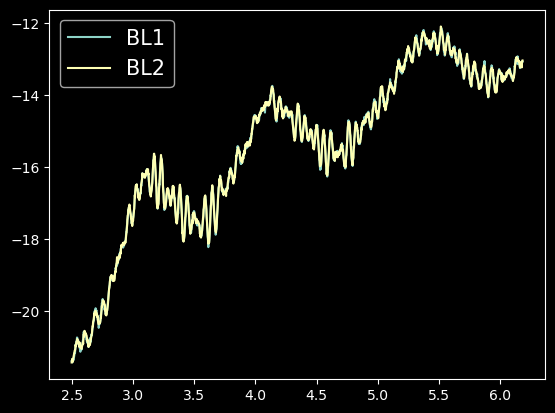

In [24]:
# looking at quieter ones
baseline1 = uf.just_single_loader(vert_baselines[2])
baseline2 = uf.just_single_loader(vert_baselines[0])
plt.figure()
plt.plot(baseline1['Freq (Hz)']/1e9, 20*np.log10(np.abs(baseline1['Complex (decimal)'])), label = 'BL1')
plt.plot(baseline2['Freq (Hz)']/1e9, 20*np.log10(np.abs(baseline2['Complex (decimal)'])), label = 'BL2')
plt.legend()

going to go with BL1 for now – seemingly has slightly higher amplitude in some places, might be good for reduction. 

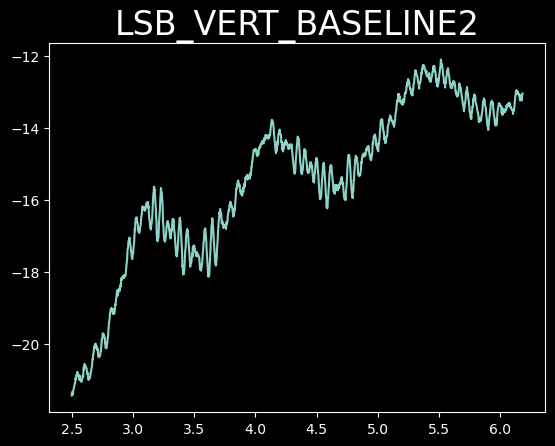

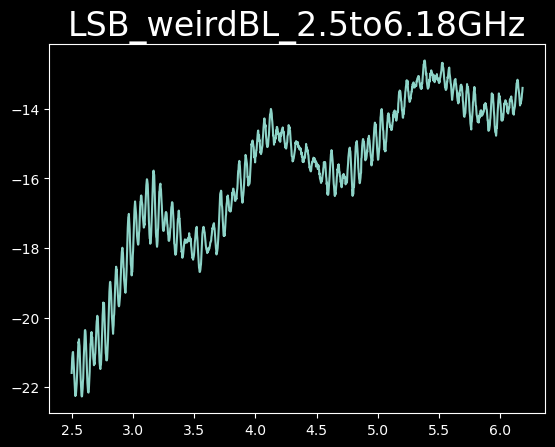

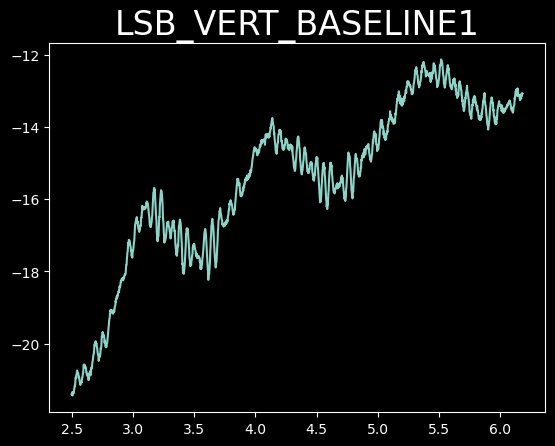

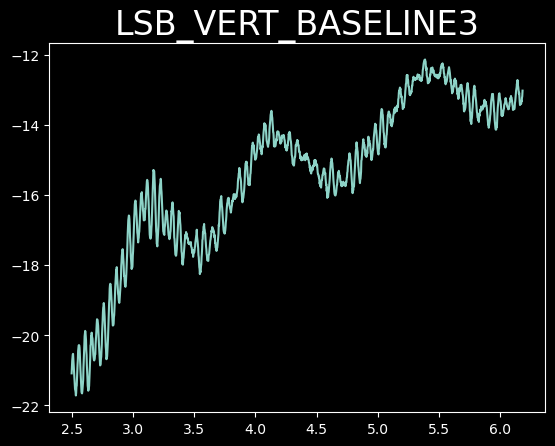

In [25]:
# look at baselines 
for i in range(len(vert_baselines)): 
    test_run = vert_baselines[i].split('/')[-1]
    run_name_split = test_run.split('_')
    run_name_for_plot = run_name_split[0] + '_' + run_name_split[1] + '_' + run_name_split[2]
    baseline = uf.just_single_loader(vert_baselines[i])
    plt.figure()
    plt.plot(baseline['Freq (Hz)']/1e9, 20*np.log10(np.abs(baseline['Complex (decimal)'])))
    plt.title(run_name_for_plot)

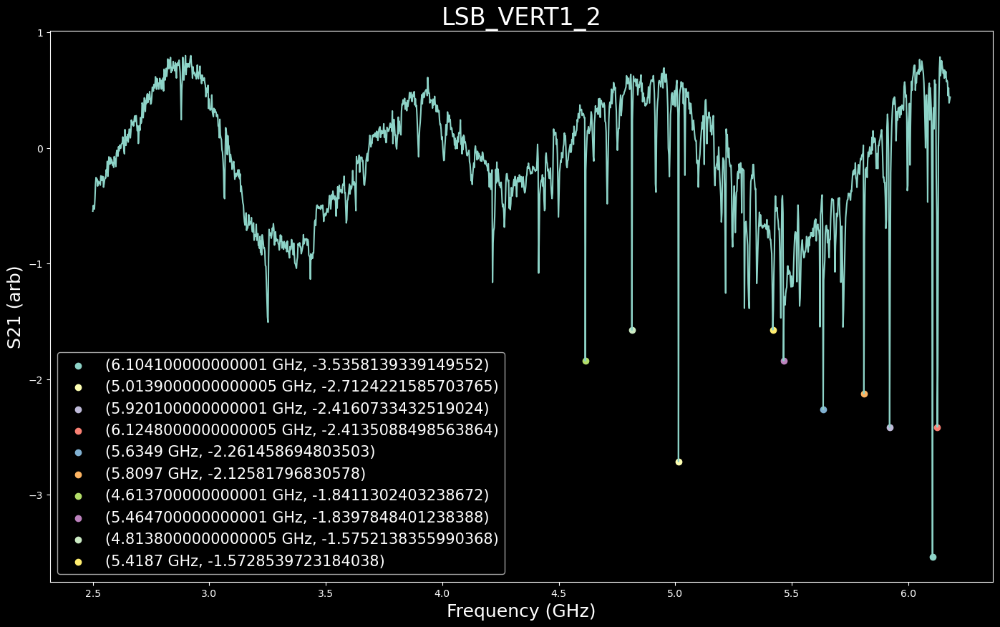

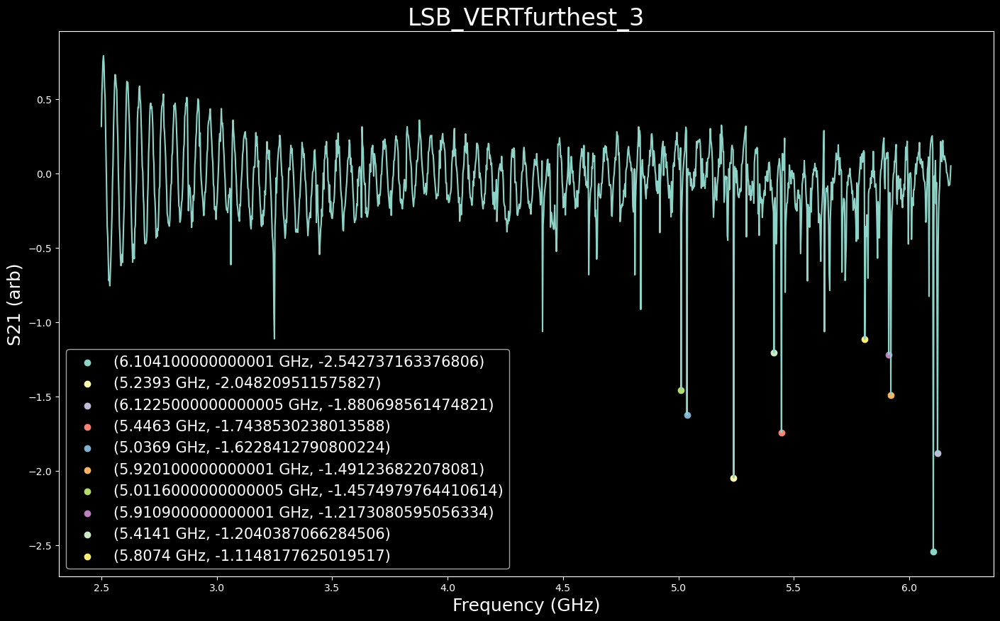

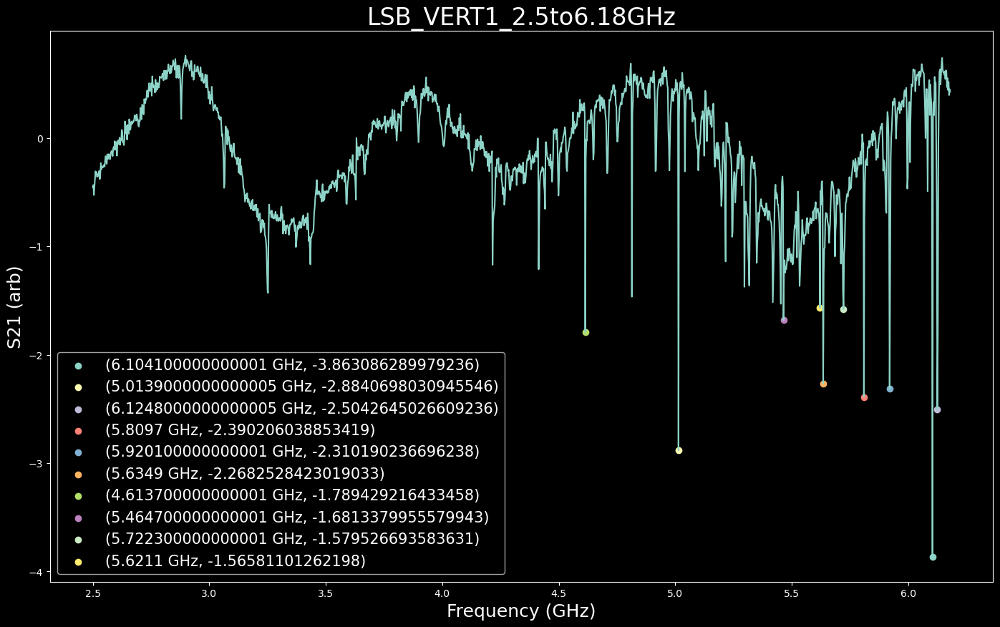

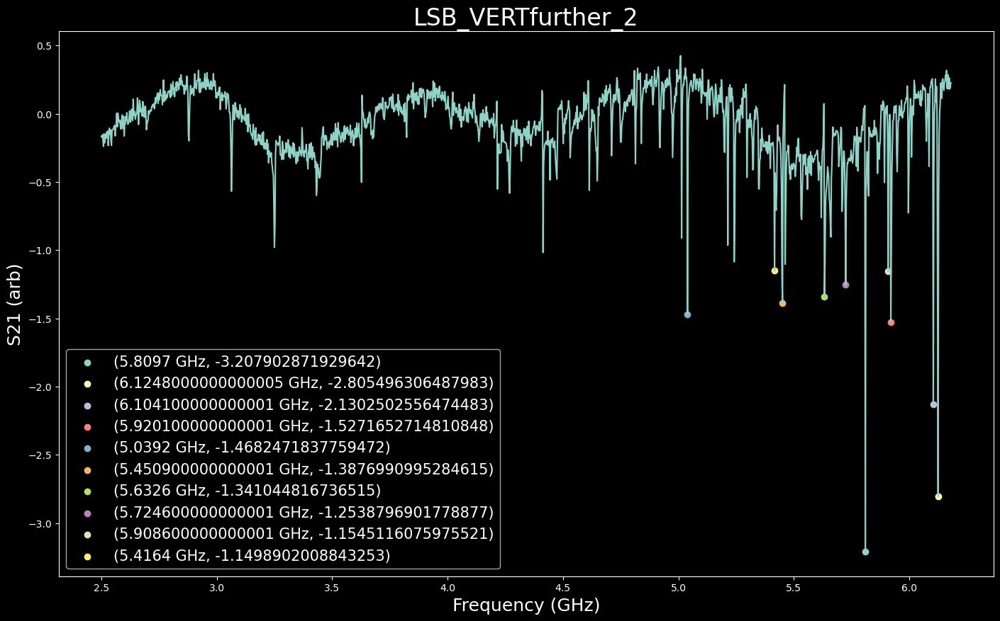

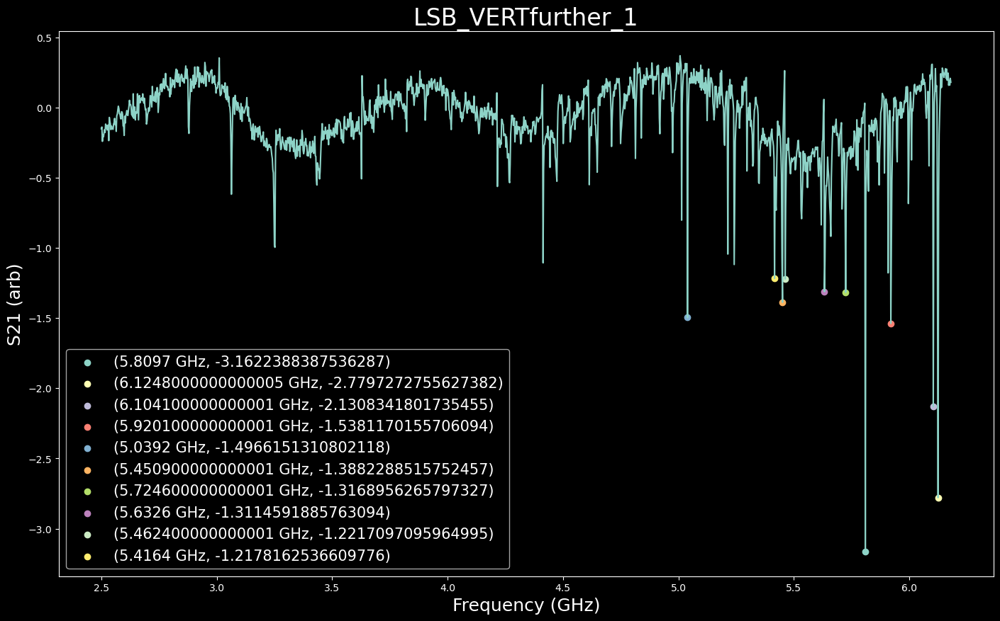

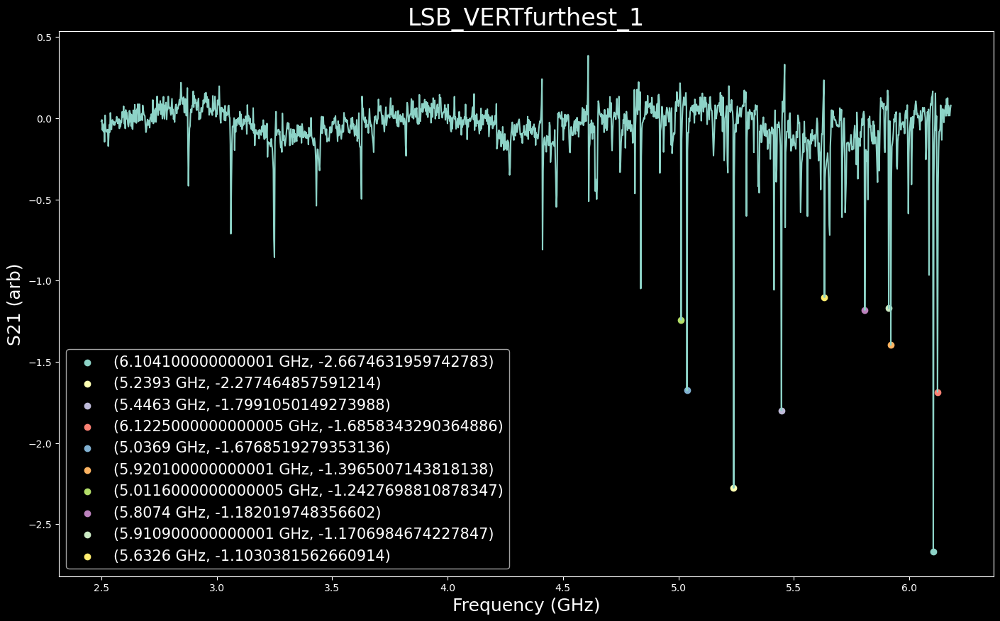

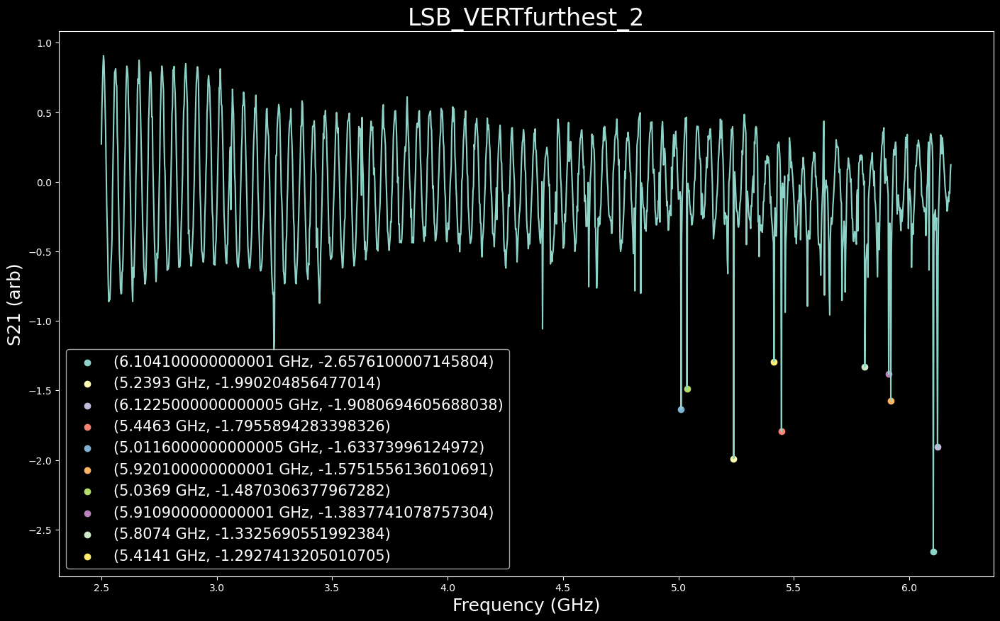

In [29]:
vert_BL_1 = 'vert_baselines/LSB_VERT_BASELINE1_3_2.5to6.18GHz_2025-06-09_14-36-50.txt'
vert_BL_2 = 'vert_baselines/LSB_VERT_BASELINE2_3_2.5to6.18GHz_2025-06-09_14-37-45.txt'
vertical = uf.VERT_folder_plotter_dipID(vert_BL_1, vert, data_folder_path)

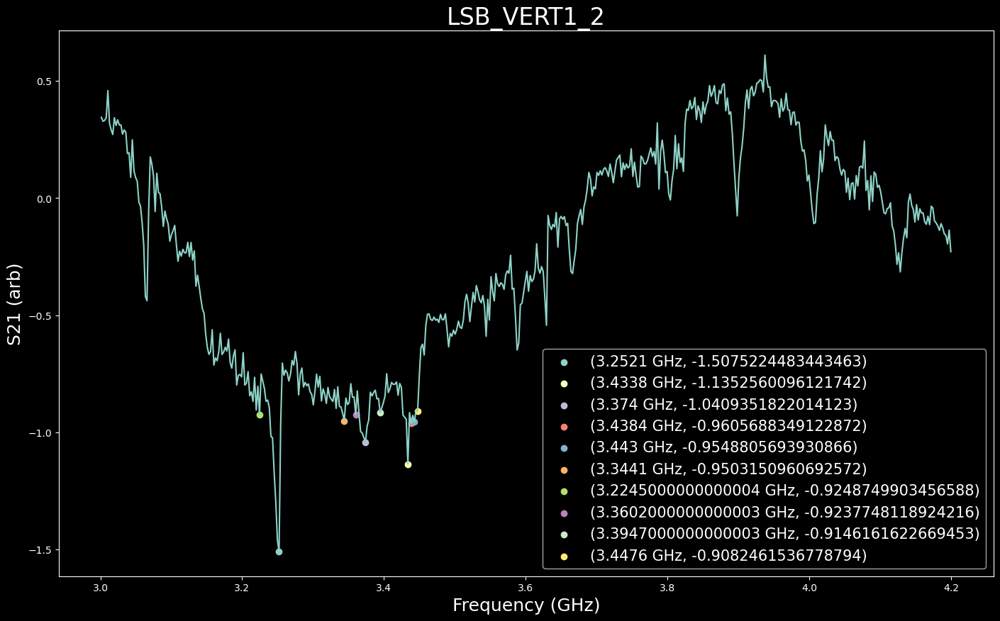

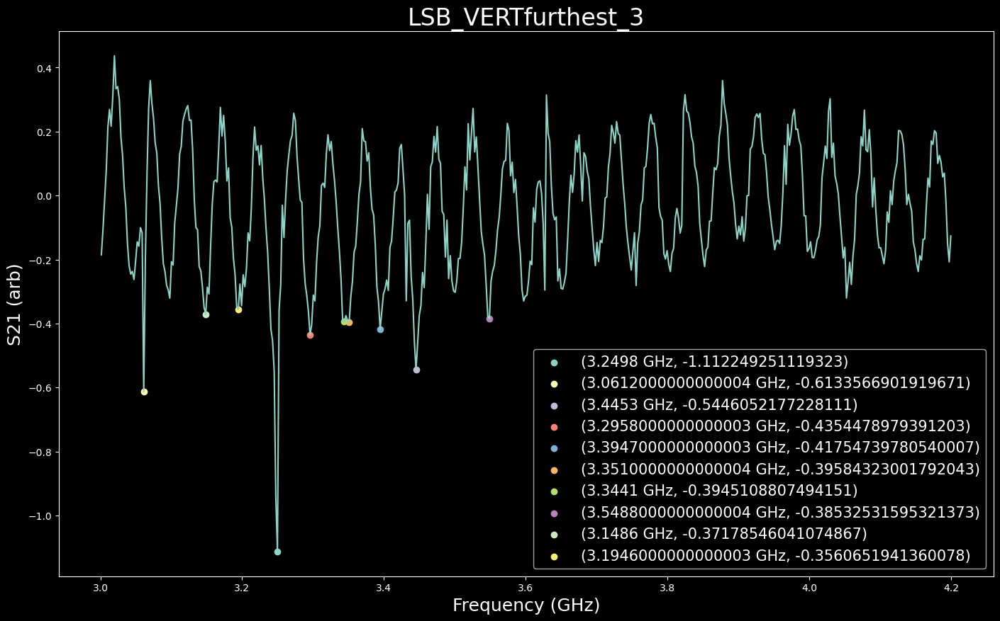

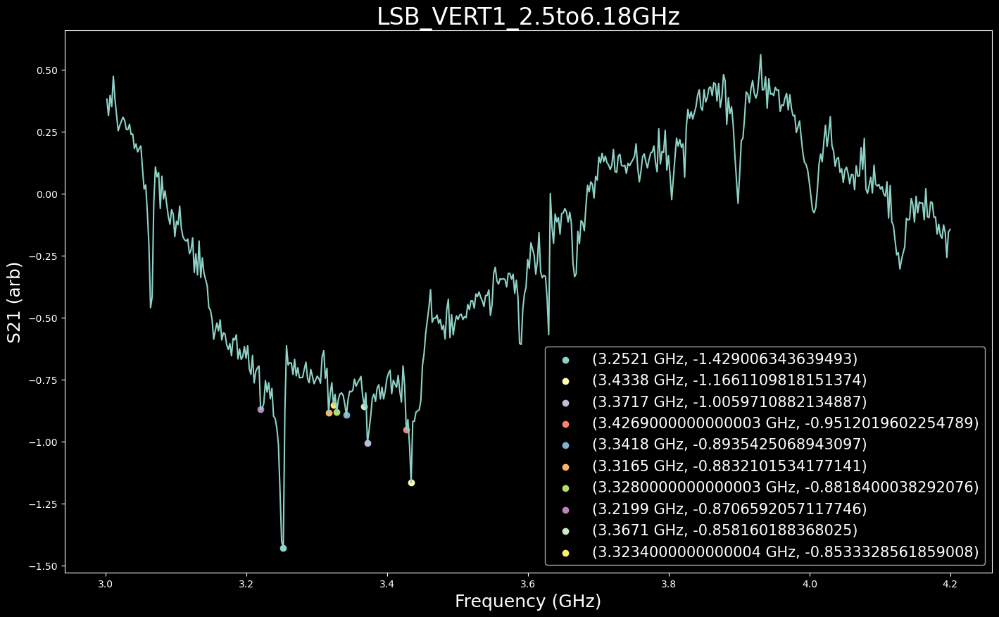

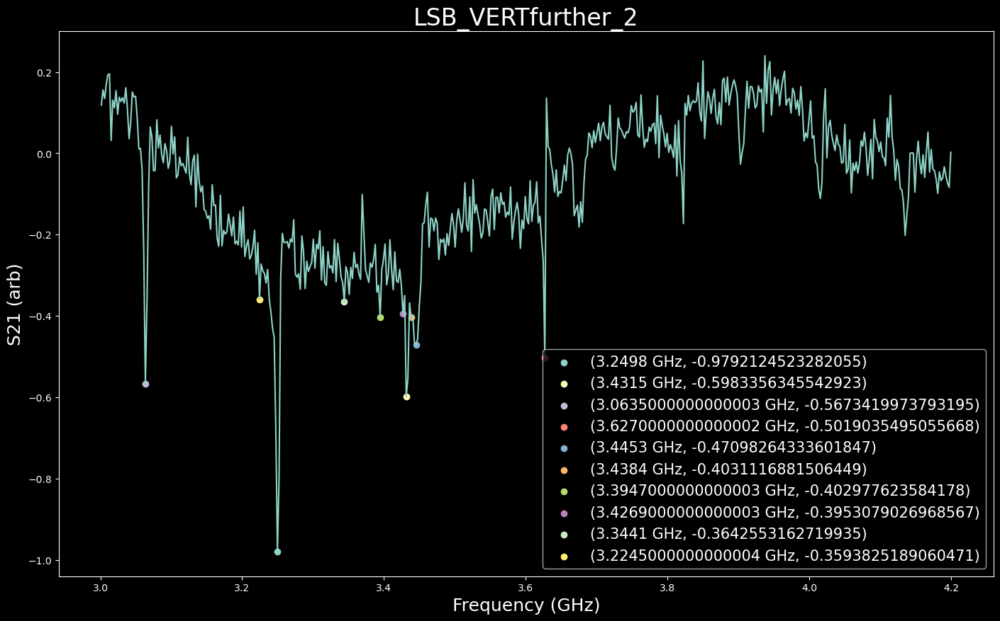

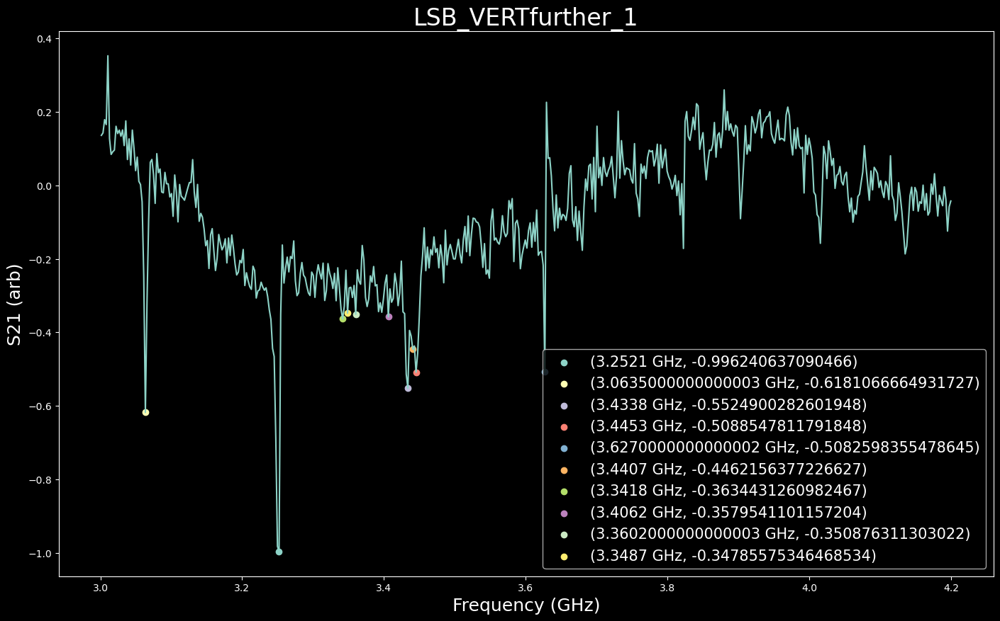

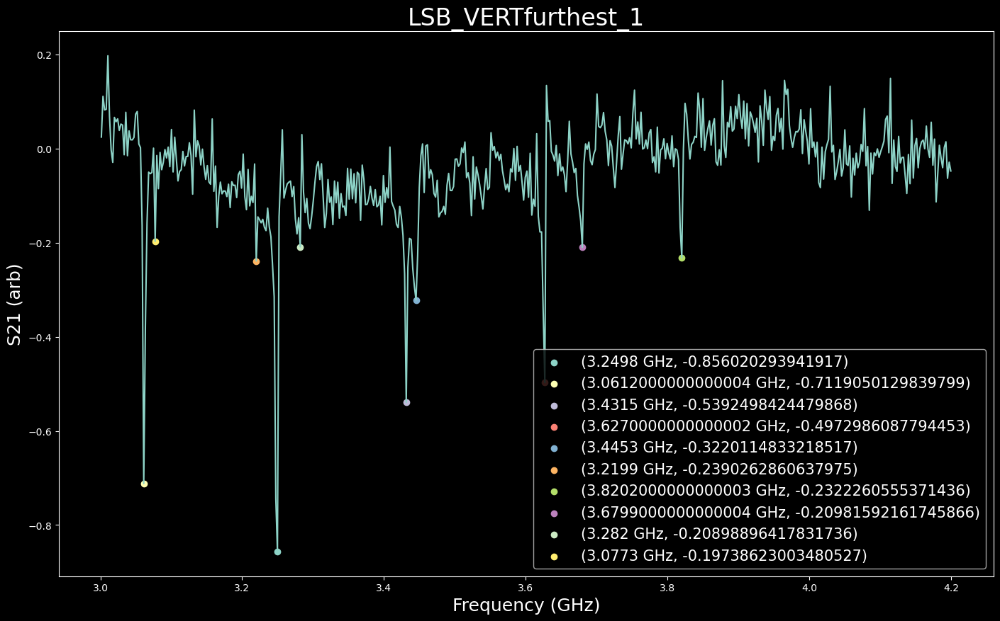

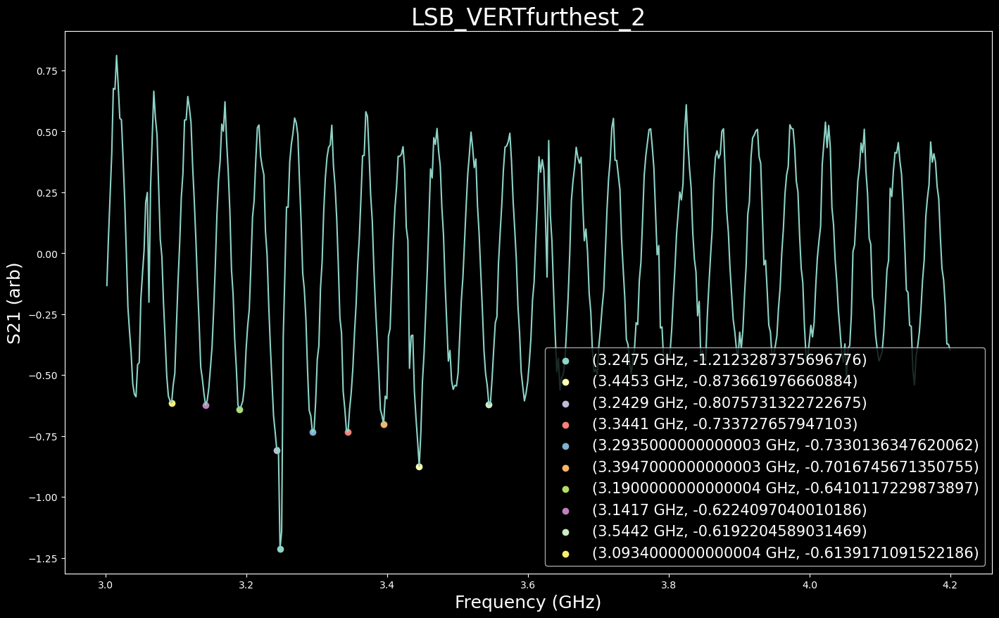

In [28]:
vertical = uf.VERT_folder_plotter_dipID(vert_BL_1, vert, data_folder_path, f_start = 3, f_stop = 4.2)